<a href="https://colab.research.google.com/github/Kunalwankhed/Mobile-Price-Range-Prediction-Preject-3/blob/main/Mobile_price_range_prediction.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# **Project Name**    -  Mobile Price Range Prediction




##### **Project Type**    - Classification
##### **Contribution**    - Individual
##### **Kunal Wankhede**


# **Problem Statement**


**In the competitive mobile phone market companies want to understand sales
data of mobile phones and factors which drive the prices. The objective is to
find out some relation between features of a mobile phone(eg:- RAM, Internal
Memory, etc) and its selling price. In this problem, we do not have to predict
the actual price but a price range indicating how high the price is.**

# **General Guidelines** : -  

1.   Well-structured, formatted, and commented code is required. 
2.   Exception Handling, Production Grade Code & Deployment Ready Code will be a plus. Those students will be awarded some additional credits. 
     
     The additional credits will have advantages over other students during Star Student selection.
       
             [ Note: - Deployment Ready Code is defined as, the whole .ipynb notebook should be executable in one go
                       without a single error logged. ]

3.   Each and every logic should have proper comments.
4. You may add as many number of charts you want. Make Sure for each and every chart the following format should be answered.
        

```
# Chart visualization code
```
            

*   Why did you pick the specific chart?
*   What is/are the insight(s) found from the chart?
* Will the gained insights help creating a positive business impact? 
Are there any insights that lead to negative growth? Justify with specific reason.

5. You have to create at least 15 logical & meaningful charts having important insights.


[ Hints : - Do the Vizualization in  a structured way while following "UBM" Rule. 

U - Univariate Analysis,

B - Bivariate Analysis (Numerical - Categorical, Numerical - Numerical, Categorical - Categorical)

M - Multivariate Analysis
 ]





6. You may add more ml algorithms for model creation. Make sure for each and every algorithm, the following format should be answered.


*   Explain the ML Model used and it's performance using Evaluation metric Score Chart.


*   Cross- Validation & Hyperparameter Tuning

*   Have you seen any improvement? Note down the improvement with updates Evaluation metric Score Chart.

*   Explain each evaluation metric's indication towards business and the business impact pf the ML model used.




















# ***Let's Begin !***

## ***1. Know Your Data***

### Import Libraries

In [ ]:
# Import Libraries
import numpy as np                               
import pandas as pd                                   
from numpy import math
import scipy.stats as stats
from scipy.stats import *
from scipy.stats import norm
import math

# visualize with plots
import matplotlib.pyplot as plt                        
%matplotlib inline
import seaborn as sns
plt.style.use('seaborn-white')
import plotly.express as px 
# do not disturb mode
import warnings  
warnings.filterwarnings('ignore')
      
# scale the data
from sklearn.preprocessing import (MinMaxScaler, StandardScaler)   
      
# split train and test data
from sklearn.model_selection import train_test_split  

from sklearn.model_selection import (cross_val_score, GridSearchCV,
                                     RandomizedSearchCV)
# Classification problem
from sklearn.tree import DecisionTreeClassifier
from sklearn.linear_model import LogisticRegression
from xgboost import XGBClassifier
from xgboost import XGBRFClassifier
from sklearn.svm import SVC

from sklearn.metrics import (accuracy_score, confusion_matrix, roc_curve,
                             roc_auc_score, classification_report)


### Dataset Loading

In [ ]:
from google.colab import drive
drive.mount('/content/drive')

# Load Dataset
ds = pd.read_csv('/content/drive/MyDrive/Kunal Wankhede -  Almabetter Project/data_mobile_price_range.csv')

Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).


### Dataset First View

In [ ]:
# Dataset First Look
ds.head()

,battery_power,blue,clock_speed,dual_sim,fc,four_g,int_memory,m_dep,mobile_wt,n_cores,...,px_height,px_width,ram,sc_h,sc_w,talk_time,three_g,touch_screen,wifi,price_range
0,842,0,2.2,0,1,0,7,0.6,188,2,...,20,756,2549,9,7,19,0,0,1,1
1,1021,1,0.5,1,0,1,53,0.7,136,3,...,905,1988,2631,17,3,7,1,1,0,2
2,563,1,0.5,1,2,1,41,0.9,145,5,...,1263,1716,2603,11,2,9,1,1,0,2
3,615,1,2.5,0,0,0,10,0.8,131,6,...,1216,1786,2769,16,8,11,1,0,0,2
4,1821,1,1.2,0,13,1,44,0.6,141,2,...,1208,1212,1411,8,2,15,1,1,0,1


### Dataset Rows & Columns count

In [ ]:
# Dataset Rows & Columns count
ds.shape

(2000, 21)

### Dataset Information

In [ ]:
# Dataset Info
ds.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 2000 entries, 0 to 1999
Data columns (total 21 columns):
 #   Column         Non-Null Count  Dtype  
---  ------         --------------  -----  
 0   battery_power  2000 non-null   int64  
 1   blue           2000 non-null   int64  
 2   clock_speed    2000 non-null   float64
 3   dual_sim       2000 non-null   int64  
 4   fc             2000 non-null   int64  
 5   four_g         2000 non-null   int64  
 6   int_memory     2000 non-null   int64  
 7   m_dep          2000 non-null   float64
 8   mobile_wt      2000 non-null   int64  
 9   n_cores        2000 non-null   int64  
 10  pc             2000 non-null   int64  
 11  px_height      2000 non-null   int64  
 12  px_width       2000 non-null   int64  
 13  ram            2000 non-null   int64  
 14  sc_h           2000 non-null   int64  
 15  sc_w           2000 non-null   int64  
 16  talk_time      2000 non-null   int64  
 17  three_g        2000 non-null   int64  
 18  touch_sc

#### Duplicate Values

In [ ]:
# Dataset Duplicate Value Count
print("Total Duplicate values count:" ,len(ds[ds.duplicated()]))

Total Duplicate values count: 0


Great, there are no duplicates in our dataset

#### Missing Values/Null Values

In [ ]:
# Missing Values/Null Values Count
print(ds.isnull().sum())

battery_power    0
blue             0
clock_speed      0
dual_sim         0
fc               0
four_g           0
int_memory       0
m_dep            0
mobile_wt        0
n_cores          0
pc               0
px_height        0
px_width         0
ram              0
sc_h             0
sc_w             0
talk_time        0
three_g          0
touch_screen     0
wifi             0
price_range      0
dtype: int64


Great, there are no any Missing Values/Null Values in our dataset

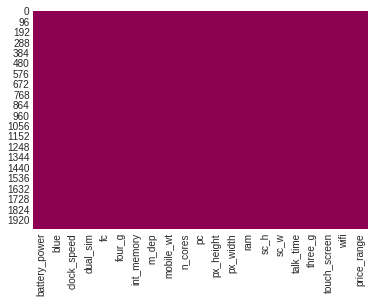

In [ ]:
# Visualizing the missing values
# Checking Null Value by plotting Heatmap
sns.heatmap(ds.isnull(), cbar=False, cmap="PiYG")

### What did you know about your dataset?





The dataset given is a dataset from mobile phone market companies, and we have to analysis the  mobile price range and the insights behind it.

Mobile price range prediction is analytical studies on the possibility of a customer abandoning a product or service. The goal is to understand and take steps to change it before the costumer gives up the product or service.

The above dataset has 2000 rows and 21 columns. There are no mising values and duplicate values in the dataset.

## ***2. Understanding Your Variables***

In [ ]:
# Dataset Columns
ds.columns

Index(['battery_power', 'blue', 'clock_speed', 'dual_sim', 'fc', 'four_g',
       'int_memory', 'm_dep', 'mobile_wt', 'n_cores', 'pc', 'px_height',
       'px_width', 'ram', 'sc_h', 'sc_w', 'talk_time', 'three_g',
       'touch_screen', 'wifi', 'price_range'],
      dtype='object')

In [ ]:
# Dataset Describe
ds.describe()

,battery_power,blue,clock_speed,dual_sim,fc,four_g,int_memory,m_dep,mobile_wt,n_cores,...,px_height,px_width,ram,sc_h,sc_w,talk_time,three_g,touch_screen,wifi,price_range
count,2000.000000,2000.0000,2000.000000,2000.000000,2000.000000,2000.000000,2000.000000,2000.000000,2000.000000,2000.000000,...,2000.000000,2000.000000,2000.000000,2000.000000,2000.000000,2000.000000,2000.000000,2000.000000,2000.000000,2000.000000
mean,1238.518500,0.4950,1.522250,0.509500,4.309500,0.521500,32.046500,0.501750,140.249000,4.520500,...,645.108000,1251.515500,2124.213000,12.306500,5.767000,11.011000,0.761500,0.503000,0.507000,1.500000
std,439.418206,0.5001,0.816004,0.500035,4.341444,0.499662,18.145715,0.288416,35.399655,2.287837,...,443.780811,432.199447,1084.732044,4.213245,4.356398,5.463955,0.426273,0.500116,0.500076,1.118314
min,501.000000,0.0000,0.500000,0.000000,0.000000,0.000000,2.000000,0.100000,80.000000,1.000000,...,0.000000,500.000000,256.000000,5.000000,0.000000,2.000000,0.000000,0.000000,0.000000,0.000000
25%,851.750000,0.0000,0.700000,0.000000,1.000000,0.000000,16.000000,0.200000,109.000000,3.000000,...,282.750000,874.750000,1207.500000,9.000000,2.000000,6.000000,1.000000,0.000000,0.000000,0.750000
50%,1226.000000,0.0000,1.500000,1.000000,3.000000,1.000000,32.000000,0.500000,141.000000,4.000000,...,564.000000,1247.000000,2146.500000,12.000000,5.000000,11.000000,1.000000,1.000000,1.000000,1.500000
75%,1615.250000,1.0000,2.200000,1.000000,7.000000,1.000000,48.000000,0.800000,170.000000,7.000000,...,947.250000,1633.000000,3064.500000,16.000000,9.000000,16.000000,1.000000,1.000000,1.000000,2.250000
max,1998.000000,1.0000,3.000000,1.000000,19.000000,1.000000,64.000000,1.000000,200.000000,8.000000,...,1960.000000,1998.000000,3998.000000,19.000000,18.000000,20.000000,1.000000,1.000000,1.000000,3.000000


### Variables Description 


*  **Battery_power** : Battery capacity in mAh
*  **Blue** : Has bluetooth or not
*  **Clock_speed** : speed at which microprocessor executes instructions
*  **Dual_sim** : Has dual sim support or not
*  **Fc** : Front Camera mega pixels
*  **Four_g** : Has 4G or not
*  **Int_memory** : Internal Memory capacity
*  **M_dep** : Mobile Depth in cm
*  **Mobile_wt** : Weight of mobile phone
*  **N_cores** : Number of cores of processor
*  **Pc** : Primary Camera mega pixels
*  **Px_height** : Pixel Resolution Height
*  **Px_width** : Pixel Resolution Width
*  **Ram** : Random Access Memory in MB
*  **Touch_screen** : Has touch screen or not
*  **Wifi** : Has wifi or not
*  **Sc_h** : Screen Height of mobile in cm
*  **Sc_w** : Screen Width of mobile in cm
*  **Talk_time** : longest time that a single battery can last over a call
*  **Three_g** : Has 3G or not
*  **Wifi** : Has wifi or not
*  **Price_range** : This is the target variable with value of 0(low cost), 1(medium cost), 2(high cost), 3(very high cost)




### Check Unique Values for each variable.

In [ ]:
# Check Unique Values for each variable.
for i in ds.columns.tolist():
  print("No. of unique values in ",i,"is",ds[i].nunique(),".")

No. of unique values in  battery_power is 1094 .
No. of unique values in  blue is 2 .
No. of unique values in  clock_speed is 26 .
No. of unique values in  dual_sim is 2 .
No. of unique values in  fc is 20 .
No. of unique values in  four_g is 2 .
No. of unique values in  int_memory is 63 .
No. of unique values in  m_dep is 10 .
No. of unique values in  mobile_wt is 121 .
No. of unique values in  n_cores is 8 .
No. of unique values in  pc is 21 .
No. of unique values in  px_height is 1137 .
No. of unique values in  px_width is 1109 .
No. of unique values in  ram is 1562 .
No. of unique values in  sc_h is 15 .
No. of unique values in  sc_w is 19 .
No. of unique values in  talk_time is 19 .
No. of unique values in  three_g is 2 .
No. of unique values in  touch_screen is 2 .
No. of unique values in  wifi is 2 .
No. of unique values in  price_range is 4 .


## 3. ***Data Wrangling***

### Data Wrangling Code

In [ ]:
# Write your code to make your dataset analysis ready.

#Check how many observations the dataset have value of 0
print('total no. of 0 value in dataset',(ds==0).sum().sum())
print(' ')
print((ds==0).sum())

total no. of 0 value in dataset 6662
 
battery_power       0
blue             1010
clock_speed         0
dual_sim          981
fc                474
four_g            957
int_memory          0
m_dep               0
mobile_wt           0
n_cores             0
pc                101
px_height           2
px_width            0
ram                 0
sc_h                0
sc_w              180
talk_time           0
three_g           477
touch_screen      994
wifi              986
price_range       500
dtype: int64


In [ ]:
# Check unique values of the front camera and primary camera
print("No. of unique values in fc is",ds['fc'].nunique(),".")
print("No. of unique values in pc is ",ds['pc'].nunique(),".")
print(' ')

#Check how many observations the front camera and primary camera have a value of 0
pd.DataFrame((ds[['fc','pc']]==0).value_counts().reset_index(name="Count"))

No. of unique values in fc is 20 .
No. of unique values in pc is  21 .
 


,fc,pc,Count
0,False,False,1526
1,True,False,373
2,True,True,101


*   In 1526 rows both front and primary cameras are not 0 i.e. both cameras are available.
*   In 373 rows front camera is 0 i.e. front camera is not available.
*   In 373 rows primary camera is not 0 i.e. primary camera is available.
*   In 101 rows both front and primary cameras are 0 i.e. both cameras are not available.

In [ ]:
# Check unique values of the pixel height and pixel width
print("No. of unique values in pixel height is",ds['px_height'].nunique(),".")
print("No. of unique values in pixel width is ",ds['px_width'].nunique(),".")
print(' ')

#Check how many observations the pixel height and pixel width have a value of 0
pd.DataFrame((ds[['px_height','px_width']]==0).value_counts().reset_index(name="Count"))

No. of unique values in pixel height is 1137 .
No. of unique values in pixel width is  1109 .
 


,px_height,px_width,Count
0,False,False,1998
1,True,False,2


In 1998 rows both pixel height and pixel width are not 0 i.e. both are available. 

In 2 rows pixel width is not 0 but pixel height is  0 i.e. we have 2 wrong/missing values in px_height column.


In [ ]:
# check how many percentage of pixel height value are 0/wrong/missing
print('percentage of pixel height value are 0/wrong/missing - ',(2/2000)*100,'%')

percentage of pixel height value are 0/wrong/missing -  0.1 %


In [ ]:
# Replace wrong/missing/0 with median of the pixel height
ds['px_width'] = ds['px_width'].replace([0], int(ds['px_width'].median()),)

In [ ]:
# after replace Check how many observations the pixel height has value of 0
(ds['px_width']==0).sum().sum()

0

In [ ]:
# Check unique values of the screen width and screen height
print("No. of unique values in screen height is",ds['sc_h'].nunique(),".")
print("No. of unique values in screen width is ",ds['sc_w'].nunique(),".")
print(' ')

#Check how many observations the screen width and screen height have a value of 0
pd.DataFrame((ds[['sc_w','sc_h']]==0).value_counts().reset_index(name="Count"))

No. of unique values in screen height is 15 .
No. of unique values in screen width is  19 .
 


,sc_w,sc_h,Count
0,False,False,1820
1,True,False,180


In 1820 rows both screen height and screen width are not 0 i.e. both are available. 

In 180 rows screen width is 0 but screen height is not 0 i.e. we have 180 wrong/missing in sc_w column.


In [ ]:
# check how many percentage of screen width value are wrong/missing/0
print('percentage of screen width value are 0/wrong/missing - ',(180/2000)*100,'%')

percentage of screen width value are 0/wrong/missing -  9.0 %


In [ ]:
# Replace wrong/missing/0 with median of the screen width
ds['sc_w'] = ds['sc_w'].replace([0], int(ds['sc_w'].median()),)

In [ ]:
# after replace Check how many observations the screen width has value of 0
(ds['sc_w']==0).sum().sum()

0

### What all manipulations have you done and insights you found?

We filtered the data and after filtering the data, we found that some columns have 0 values which are wrong values inserted in the data. Then we replaced it with a median column.

## ***4. Data Vizualization, Storytelling & Experimenting with charts : Understand the relationships between variables***

#### Chart - 1 - Pie Chart and countplot on Dependant Variable i.e., price_range (Univariate)

1    500
2    500
3    500
0    500
Name: price_range, dtype: int64


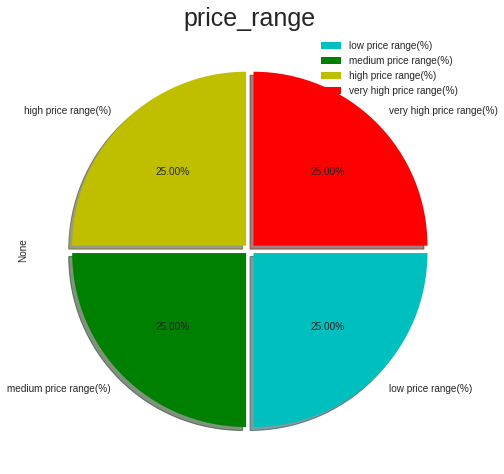

In [ ]:
# Chart - 1 visualization code
# Dependant variable Value Counts
print(ds['price_range'].value_counts())

# Dependant Variable Visualization use a pie chart
plt.figure(figsize=(8,8))
(ds[['price_range']].value_counts(normalize=True)*[100]).plot(kind='pie', 
                                                              autopct='%1.2f%%', 
                                                              textprops={'fontsize': 10},
                                                              labels=['low price range(%)','medium price range(%)',
                                                                       'high price range(%)','very high price range(%)'],
                                                              colors = ['c','g','y','r'],
                                                              explode =[0.03, 0.03, 0.03, 0.03],
                                                              shadow=True, counterclock=False)
plt.title('price_range',fontsize = 25)
plt.legend(fontsize = 10)
plt.show()


##### 1. Why did you pick the specific chart?

A pie chart expresses a part-to-whole relationship in your data. It's easy to explain the percentage comparison through an area covered in a circle with different colors. Where different percentage comparison comes into action pie chart is used frequently. So, I used a Pie chart and which helped me to get the percentage comparison of the dependent variable.

##### 2. What is/are the insight(s) found from the chart?

From the above chart, I got to know that,  there are 500 price range which are low price range which is 25% of the whole price range data given in the dataset. 

In other hand, 500 price range which are medium price range which is 25% of the whole price range data given in the dataset.

In other hand, 500 price range which are high price range which is 25% of the whole price range data given in the dataset.

In other hand, 500 price range which are very high price range which is 25% of the whole price range data given in the dataset.


#### Chart - 2 - ram with price range wise

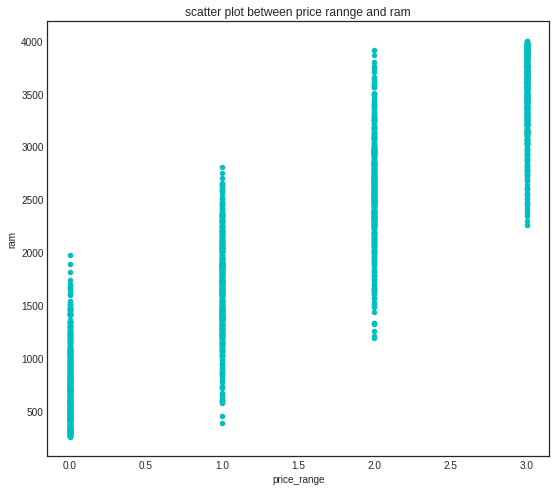

In [ ]:
# Chart - 2 visualization code
# creating the scatter plot
ds.plot(x="price_range", y="ram", kind="scatter", figsize=(9, 8), color = 'c')
plt.title('scatter plot between price rannge and ram')
plt.show()

##### 1. Why did you pick the specific chart?

A scatter plot is useful for identifying other patterns in data. We can divide data points into groups based on how closely sets of points cluster together.  So, I used a Scatter plot and which helped me to get the comparison of the price range and ram.

##### 2. What is/are the insight(s) found from the chart?

From the above scatter plot, I found that there is a price range is increase also increase RAM. from upto 2000 MB.

There is RAM for low price range from upto 2000 MB, RAM for midium price range from 300 to 2900 MB, RAM for high price range from 1200 to 3900 MB, RAM for very high price range from 2200 to 4100 MB.

#### Chart - 3 - blue with price range wise

0    1010
1     990
Name: blue, dtype: int64


[Text(0, 0, 'Does not Support'), Text(0, 0, 'Support')]

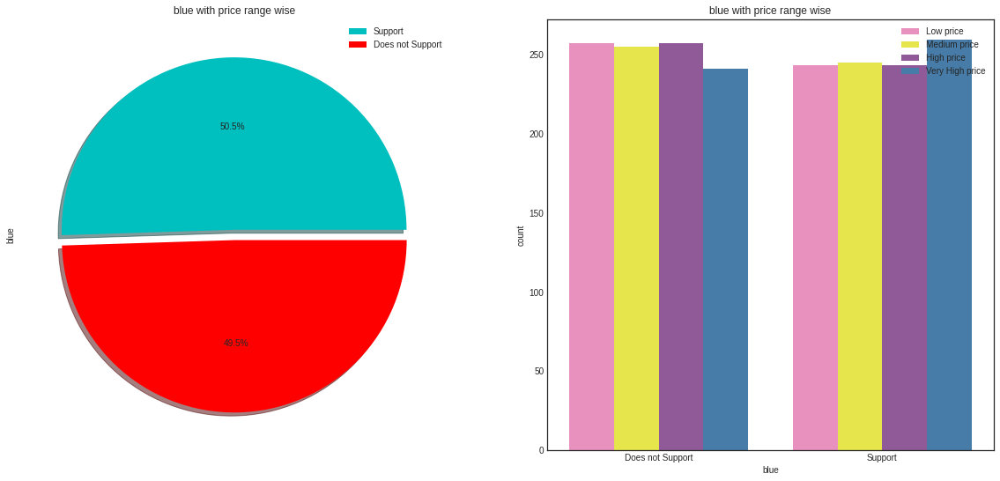

In [ ]:
# Chart - 3 visualization code
print(ds['blue'].value_counts())

fig, (plot1, plot2) = plt.subplots(ncols = 2, figsize = (20, 9))

ds['blue'].value_counts().plot.pie (autopct='%1.1f%%', ax = plot1, explode =[0.03, 0.03], 
                                    colors = ['c','r'],shadow=True, labeldistance=None)
plot1.set_title('blue with price range wise')
plot1.legend(['Support', 'Does not Support'])

sns.countplot(x = 'blue', hue = 'price_range', data = ds, ax = plot2, palette = "Set1_r")
plot2.set_title('blue with price range wise')
plot2.set_xlabel('blue')
plot2.legend(['Low price', 'Medium price', 'High price', 'Very High price'])
plot2.set_xticklabels(['Does not Support', 'Support'])

##### 1. Why did you pick the specific chart?

A pie chart expresses a part-to-whole relationship in your data. It's easy to explain the percentage comparison through area covered in a circle with different colors. Where differenet percentage comparison comes into action pie chart is used frequently. So, I used Pie chart and which helped me to get the percentage comparision of the price range percentage blue wise.

count plot show the frequency counts of values for the different levels of a categorical or nominal variable.

##### 2. What is/are the insight(s) found from the chart?

**pie chart :**

I got to know that, there are 1010 bluetooth data which are bluetooth support which is 50.5% of the whole bluetooth data given in the dataset. 

In other hand, 990 bluetooth data which are bluetooth does not support which is 49.5% of the whole price range data given in the dataset.

**count plot :**

I found out that low price, medium price, high price and very high price all does not support bluetooth and blue support data both are almost same.


#### Chart - 4 - three_g with price range wise

1    1523
0     477
Name: three_g, dtype: int64


[Text(0, 0, 'Does not Support'), Text(0, 0, 'Support')]

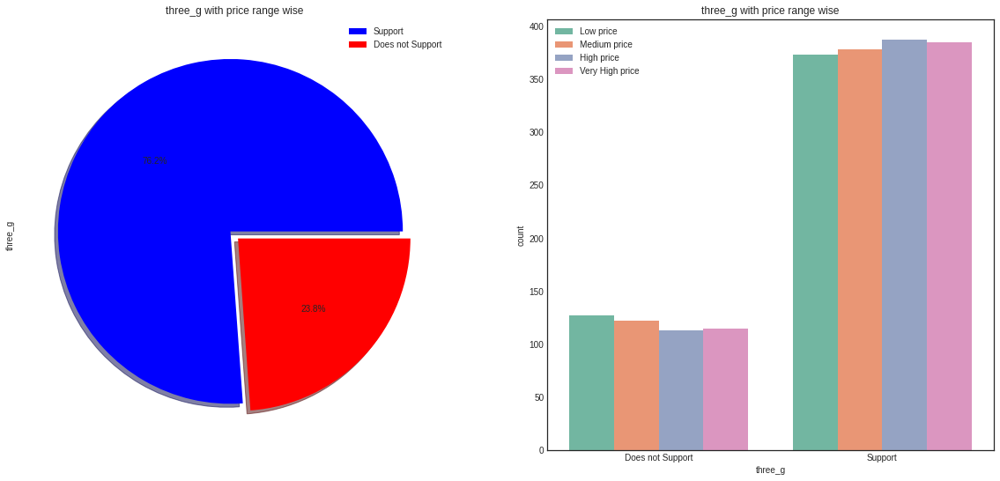

In [ ]:
# Chart - 4 visualization code
print(ds['three_g'].value_counts())

fig, (plot1, plot2) = plt.subplots(ncols = 2, figsize = (20, 9))

ds['three_g'].value_counts().plot.pie (autopct='%1.1f%%', ax = plot1, explode =[0.03, 0.03], 
                                    colors = ['b','r'],shadow=True, labeldistance=None)
plot1.set_title('three_g with price range wise')
plot1.legend(['Support', 'Does not Support'])

sns.countplot(x = 'three_g', hue = 'price_range', data = ds, ax = plot2, palette = "Set2")
plot2.set_title('three_g with price range wise')
plot2.set_xlabel('three_g')
plot2.legend(['Low price', 'Medium price', 'High price', 'Very High price'])
plot2.set_xticklabels(['Does not Support', 'Support'])

##### 1. Why did you pick the specific chart?

A pie chart expresses a part-to-whole relationship in your data. It's easy to explain the percentage comparison through area covered in a circle with different colors. Where differenet percentage comparison comes into action pie chart is used frequently. So, I used Pie chart and which helped me to get the percentage comparision of the price range percentage three_g wise.

count plot show the frequency counts of values for the different levels of a categorical or nominal variable.

##### 2. What is/are the insight(s) found from the chart?

**pie chart :**

I got to know that, there are 1523 3G data which are bluetooth support which is 76.2% of the whole 3G data given in the dataset. 

In other hand, 477 3G data which are bluetooth does not support which is 23.8% of the whole 3G data given in the dataset.

**count plot :**

I found out that low price, medium price, high price and very high price all does not support 3G data is less that support 3G data.

Low price, medium price, high price and very high price all does not support 3G data are almost same.

Low price, medium price, high price and very high price all support 3G data are almost same.



#### Chart - 5 - four_g with price range wise

1    1043
0     957
Name: four_g, dtype: int64


[Text(0, 0, 'Does not Support'), Text(0, 0, 'Support')]

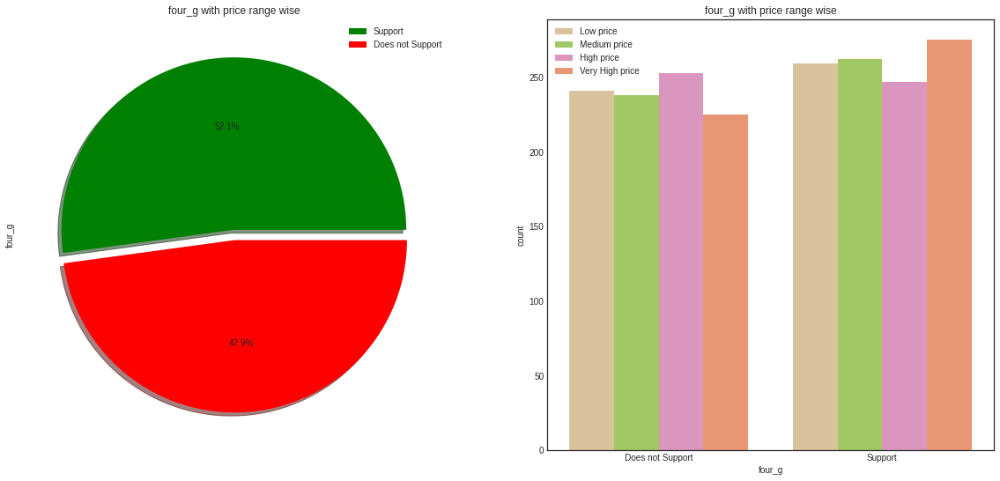

In [ ]:
# Chart - 5 visualization code
print(ds['four_g'].value_counts())

fig, (plot1, plot2) = plt.subplots(ncols = 2, figsize = (20, 9))

ds['four_g'].value_counts().plot.pie (autopct='%1.1f%%', ax = plot1, explode =[0.03, 0.03], 
                                    colors = ['g','r'],shadow=True, labeldistance=None)
plot1.set_title('four_g with price range wise')
plot1.legend(['Support', 'Does not Support'])

sns.countplot(x = 'four_g', hue = 'price_range', data = ds, ax = plot2, palette = "Set2_r")
plot2.set_title('four_g with price range wise')
plot2.set_xlabel('four_g')
plot2.legend(['Low price', 'Medium price', 'High price', 'Very High price'])
plot2.set_xticklabels(['Does not Support', 'Support'])

##### 1. Why did you pick the specific chart?

A pie chart expresses a part-to-whole relationship in your data. It's easy to explain the percentage comparison through area covered in a circle with different colors. Where differenet percentage comparison comes into action pie chart is used frequently. So, I used Pie chart and which helped me to get the percentage comparision of the price range percentage four_g wise.

count plot show the frequency counts of values for the different levels of a categorical or nominal variable.

##### 2. What is/are the insight(s) found from the chart?

**pie chart :**

I got to know that, there are 1043 4G data which are 4G support which is 52.1% of the whole 4G data given in the dataset. 

In other hand, 957 4G data which are 4G does not support which is 47.9% of the whole 4G data given in the dataset.

**count plot :**

I found out that low price, medium price,and very high price all does not support 4G data is less that support 4G data, but high price does not support 4G data and support 4G data both are almost same.



#### Chart - 6 - wifi with price range wise

1    1014
0     986
Name: wifi, dtype: int64


[Text(0, 0, 'Does not Support'), Text(0, 0, 'Support')]

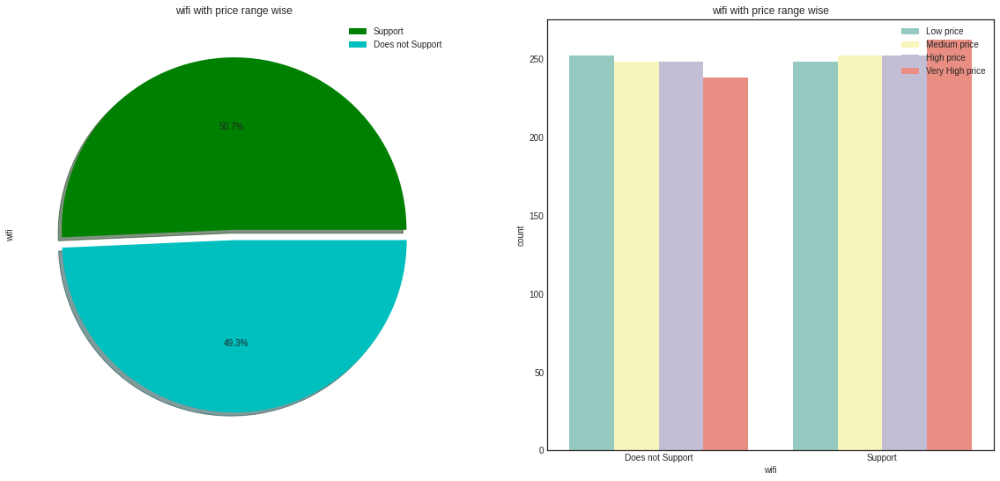

In [ ]:
# Chart - 6 visualization code
print(ds['wifi'].value_counts())

fig, (plot1, plot2) = plt.subplots(ncols = 2, figsize = (20, 9))

ds['wifi'].value_counts().plot.pie (autopct='%1.1f%%', ax = plot1, explode =[0.03, 0.03], 
                                    colors = ['g','c'],shadow=True, labeldistance=None)
plot1.set_title('wifi with price range wise')
plot1.legend(['Support', 'Does not Support'])

sns.countplot(x = 'wifi', hue = 'price_range', data = ds, ax = plot2, palette = "Set3")
plot2.set_title('wifi with price range wise')
plot2.set_xlabel('wifi')
plot2.legend(['Low price', 'Medium price', 'High price', 'Very High price'])
plot2.set_xticklabels(['Does not Support', 'Support'])

##### 1. Why did you pick the specific chart?

A pie chart expresses a part-to-whole relationship in your data. It's easy to explain the percentage comparison through area covered in a circle with different colors. Where differenet percentage comparison comes into action pie chart is used frequently. So, I used Pie chart and which helped me to get the percentage comparision of the price range percentage four_g wise.

count plot show the frequency counts of values for the different levels of a categorical or nominal variable.

##### 2. What is/are the insight(s) found from the chart?

**pie chart :**

I got to know that, there are 1014 WiFi data which are WiFi support which is 50.7% of the whole WiFi data given in the dataset. 

In other hand, 986 WiFi data which are WiFi does not support which is 49.3% of the WiFi data given in the dataset.

**count plot :**

I found out that low price, medium price, high price and very high price all does not support WiFi data and WiFi support data both are almost same.


#### Chart - 7 - dual_sim with price range wise

1    1019
0     981
Name: dual_sim, dtype: int64


[Text(0, 0, 'Does not Support'), Text(0, 0, 'Support')]

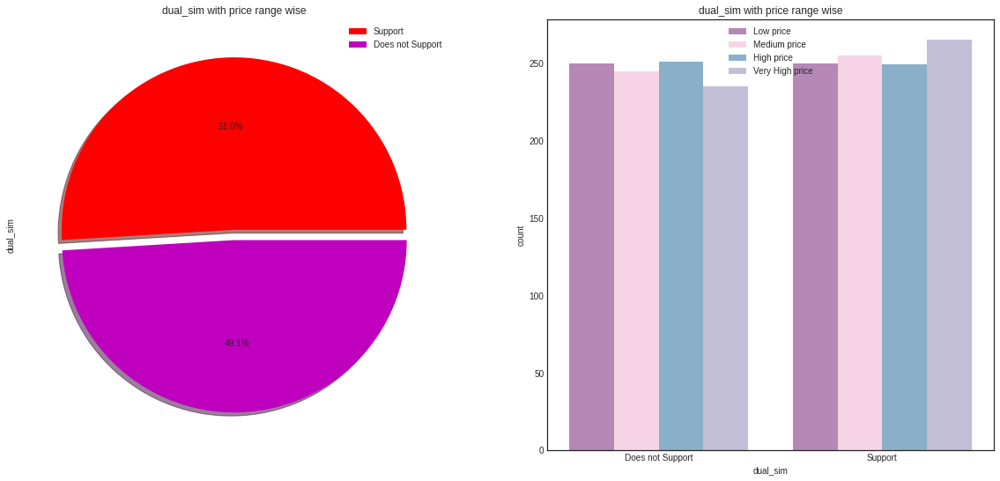

In [ ]:
# Chart - 7 visualization code
print(ds['dual_sim'].value_counts())

fig, (plot1, plot2) = plt.subplots(ncols = 2, figsize = (20, 9))

ds['dual_sim'].value_counts().plot.pie (autopct='%1.1f%%', ax = plot1, explode =[0.03, 0.03], 
                                    colors = ['r','m'],shadow=True, labeldistance=None)
plot1.set_title('dual_sim with price range wise')
plot1.legend(['Support', 'Does not Support'])

sns.countplot(x = 'dual_sim', hue = 'price_range', data = ds, ax = plot2, palette = "Set3_r")
plot2.set_title('dual_sim with price range wise')
plot2.set_xlabel('dual_sim')
plot2.legend(['Low price', 'Medium price', 'High price', 'Very High price'])
plot2.set_xticklabels(['Does not Support', 'Support'])

##### 1. Why did you pick the specific chart?

A pie chart expresses a part-to-whole relationship in your data. It's easy to explain the percentage comparison through area covered in a circle with different colors. Where differenet percentage comparison comes into action pie chart is used frequently. So, I used Pie chart and which helped me to get the percentage comparision of the price range percentage dual_sim wise.

count plot show the frequency counts of values for the different levels of a categorical or nominal variable.

##### 2. What is/are the insight(s) found from the chart?

**pie chart :**

I got to know that, there are 1019 dual sim data which are dual sim support which is 51% of the whole dual sim data given in the dataset. 

In other hand, 981 dual sim data which are dual sim does not support which is 49% of the whole dual sim data given in the dataset.

**count plot :**

I found out that low price, medium price,and high price all does not support dual sim data is less that support dual sim, but very high price does not support dual sim data and support dual sim data both are almost same.



#### Chart - 8 - battery_power with price range wise

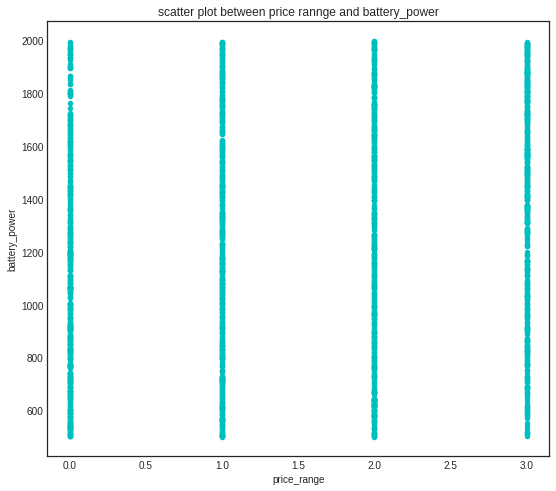

In [ ]:
# Chart - 8 visualization code
# creating the scatter plot
ds.plot(x="price_range", y="battery_power", kind="scatter", figsize=(9, 8), color = 'c')
plt.title('scatter plot between price rannge and battery_power')
plt.show()

##### 1. Why did you pick the specific chart?

A scatter plot is useful for identifying other patterns in data. We can divide data points into groups based on how closely sets of points cluster together.  So, I used a Scatter plot and which helped me to get the comparison of the price range and battery power.

##### 2. What is/are the insight(s) found from the chart?

Above plot show how the battery mAh is spread. Battery power has constant with price range while moving from Low cost to Very high cost

#### Chart - 9 - Internal memory capacity with price range wise

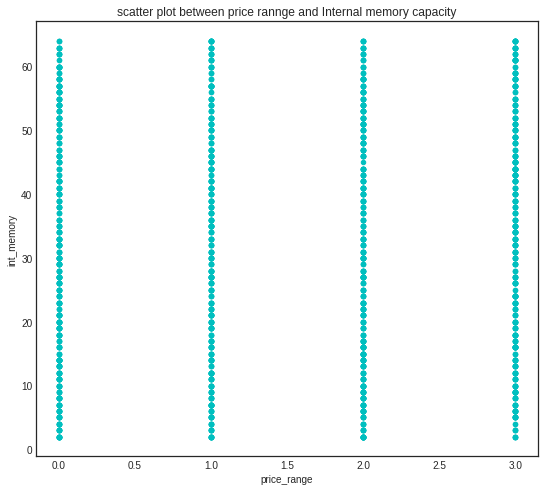

In [ ]:
# Chart - 9 visualization code
# creating the scatter plot
ds.plot(x="price_range", y="int_memory", kind="scatter", figsize=(9, 8), color = 'c')
plt.title('scatter plot between price rannge and Internal memory capacity')
plt.show()

##### 1. Why did you pick the specific chart?

A scatter plot is useful for identifying other patterns in data. We can divide data points into groups based on how closely sets of points cluster together.  So, I used a Scatter plot and which helped me to get the comparison of the price range and internal memory capacity.

##### 2. What is/are the insight(s) found from the chart?

Above plot show how the internal memory MB is spread. Internal memory capacity  has constant with price range while moving from Low cost to Very high cost

#### Chart - 10 - Front camera with price range wise

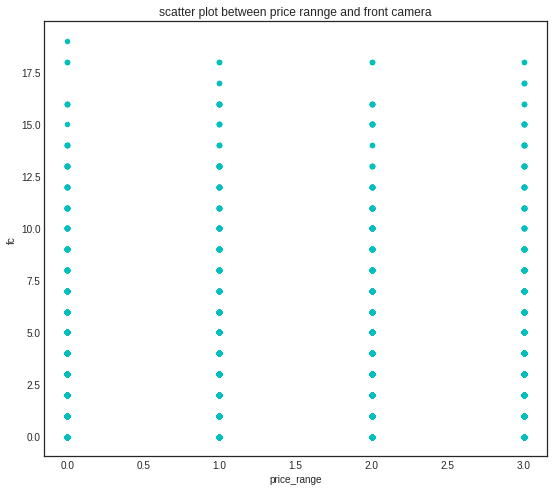

In [ ]:
# Chart - 10 visualization code
# creating the scatter plot
ds.plot(x="price_range", y="fc", kind="scatter", figsize=(9, 8), color = 'c')
plt.title('scatter plot between price rannge and front camera')
plt.show()

##### 1. Why did you pick the specific chart?

A scatter plot is useful for identifying other patterns in data. We can divide data points into groups based on how closely sets of points cluster together.  So, I used a Scatter plot and which helped me to get the comparison of the price range and front camera.

##### 2. What is/are the insight(s) found from the chart?

Above plot show how the front camera Mega pixel is spread. Front camera has almost constant with price range while moving from Low cost to Very high cost

#### Chart - 11 - Primary camera with price range wise

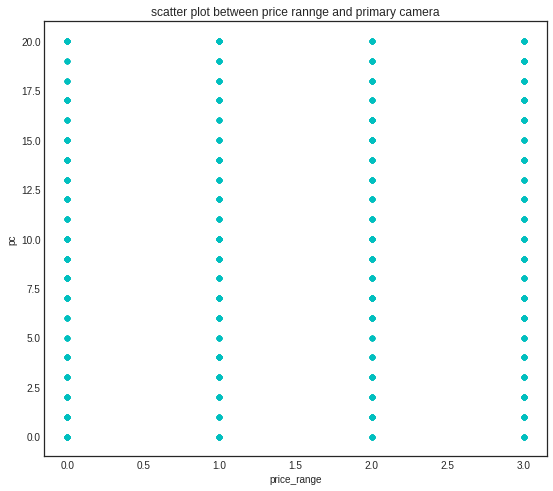

In [ ]:
# Chart - 11 visualization code
# creating the scatter plot
ds.plot(x="price_range", y="pc", kind="scatter", figsize=(9, 8), color = 'c')
plt.title('scatter plot between price rannge and primary camera')
plt.show()

##### 1. Why did you pick the specific chart?

A scatter plot is useful for identifying other patterns in data. We can divide data points into groups based on how closely sets of points cluster together.  So, I used a Scatter plot and which helped me to get the comparison of the price range and primary camera.

##### 2. What is/are the insight(s) found from the chart?

Above plot show how the primary camera Mega pixel is spread. Front camera has  constant with price range while moving from Low cost to Very high cost

#### Chart - 12 - Mobile depth with price range wise

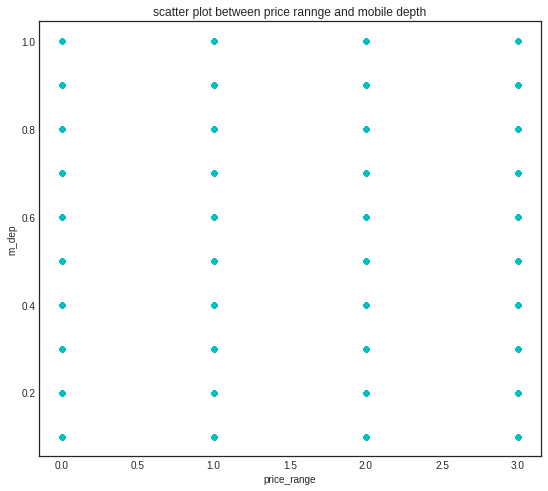

In [ ]:
# Chart - 12 visualization code
# creating the scatter plot
ds.plot(x="price_range", y="m_dep", kind="scatter", figsize=(9, 8), color = 'c')
plt.title('scatter plot between price rannge and mobile depth')
plt.show()

##### 1. Why did you pick the specific chart?

A scatter plot is useful for identifying other patterns in data. We can divide data points into groups based on how closely sets of points cluster together.  So, I used a Scatter plot and which helped me to get the comparison of the price range and primary camera.

##### 2. What is/are the insight(s) found from the chart?

Above plot show how the mobile depth in cm is spread. Mobile depth has  constant with price range while moving from Low cost to Very high cost

#### Chart - 13 - mobile weight with price range wise

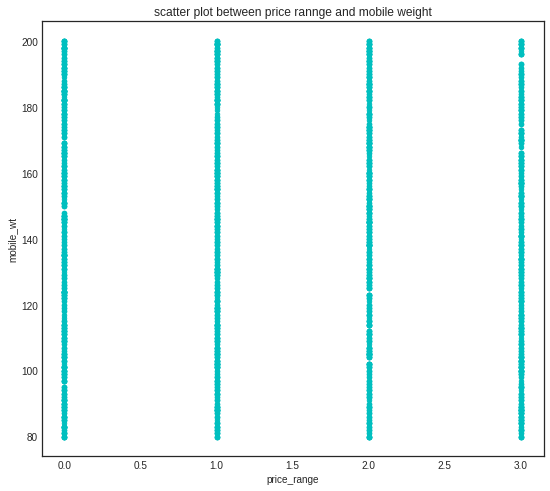

In [ ]:
# Chart - 13 visualization code
# creating the scatter plot
ds.plot(x="price_range", y="mobile_wt", kind="scatter", figsize=(9, 8), color = 'c')
plt.title('scatter plot between price rannge and mobile weight')
plt.show()

##### 1. Why did you pick the specific chart?

A scatter plot is useful for identifying other patterns in data. We can divide data points into groups based on how closely sets of points cluster together.  So, I used a Scatter plot and which helped me to get the comparison of the price range and mobile width.

##### 2. What is/are the insight(s) found from the chart?

Mobile weight has constant with price range while moving from Low price to Very high price.

#### Chart - 14 - screen height with price range wise

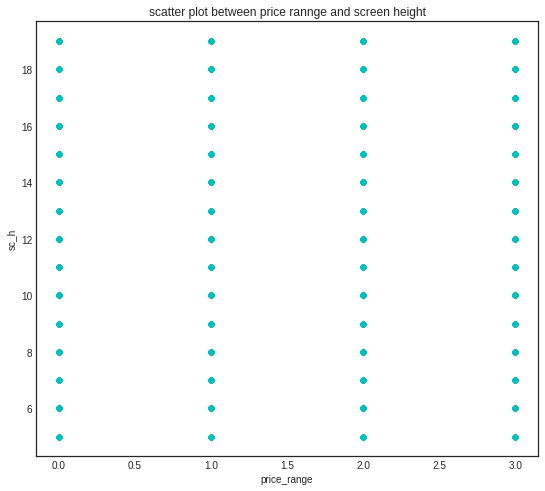

In [ ]:
# Chart - 14 visualization code
# creating the scatter plot
ds.plot(x="price_range", y="sc_h", kind="scatter", figsize=(9, 8), color = 'c')
plt.title('scatter plot between price rannge and screen height')
plt.show()

##### 1. Why did you pick the specific chart?

A scatter plot is useful for identifying other patterns in data. We can divide data points into groups based on how closely sets of points cluster together.  So, I used a Scatter plot and which helped me to get the comparison of the price range and screen height.

##### 2. What is/are the insight(s) found from the chart?

Screen height has  constant with price range while moving from Low cost to Very high cost.

#### Chart - 15 - screen width with price range wise

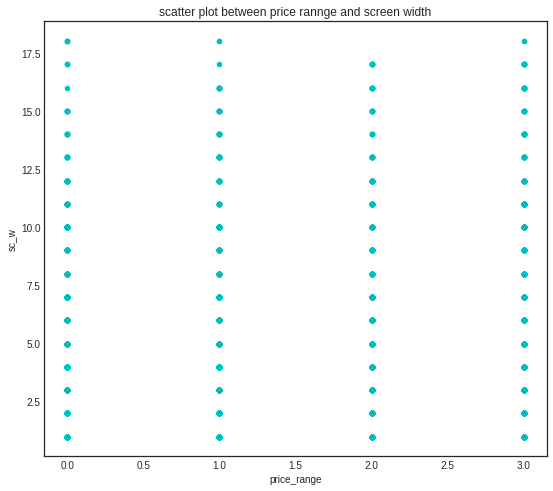

In [ ]:
# Chart - 15 visualization code
# creating the scatter plot
ds.plot(x="price_range", y="sc_w", kind="scatter", figsize=(9, 8), color = 'c')
plt.title('scatter plot between price rannge and screen width')
plt.show()

##### 1. Why did you pick the specific chart?

A scatter plot is useful for identifying other patterns in data. We can divide data points into groups based on how closely sets of points cluster together.  So, I used a Scatter plot and which helped me to get the comparison of the price range and screen height.

##### 2. What is/are the insight(s) found from the chart?

Screen width has almost constant with price range while moving from Low cost to Very high cost.

#### Chart - 16 - pixel height with price range wise

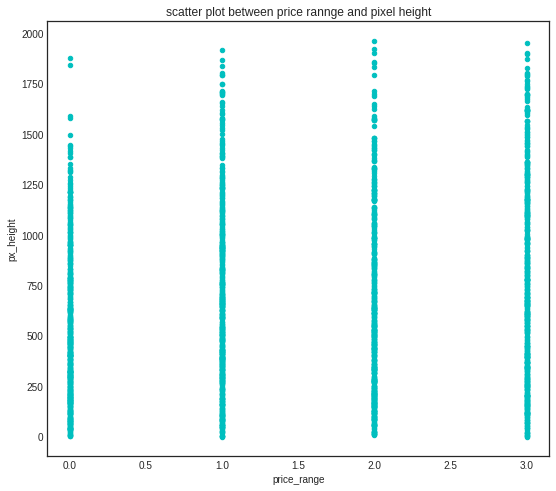

In [ ]:
# Chart - 16 visualization code
# creating the scatter plot
ds.plot(x="price_range", y="px_height", kind="scatter", figsize=(9, 8), color = 'c')
plt.title('scatter plot between price rannge and pixel height')
plt.show()

##### 1. Why did you pick the specific chart?

A scatter plot is useful for identifying other patterns in data. We can divide data points into groups based on how closely sets of points cluster together.  So, I used a Scatter plot and which helped me to get the comparison of the price range and pixel height.

##### 2. What is/are the insight(s) found from the chart?

Pixel height has almost constant with price range while moving from Low cost to Very high cost.

#### Chart - 17 - pixel width with price range wise

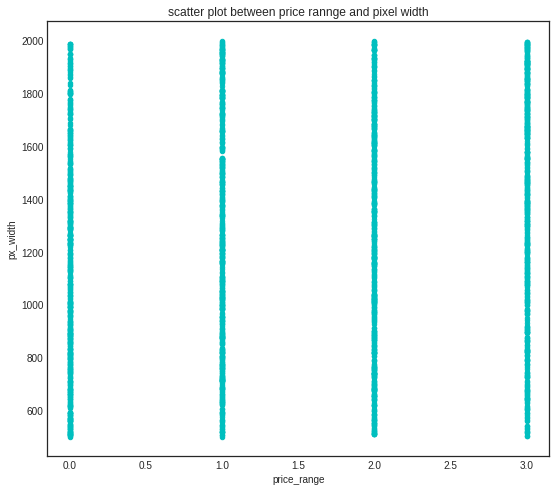

In [ ]:
# Chart - 17 visualization code
# creating the scatter plot
ds.plot(x="price_range", y="px_width", kind="scatter", figsize=(9, 8), color = 'c')
plt.title('scatter plot between price rannge and pixel width')
plt.show()

##### 1. Why did you pick the specific chart?

A scatter plot is useful for identifying other patterns in data. We can divide data points into groups based on how closely sets of points cluster together.  So, I used a Scatter plot and which helped me to get the comparison of the price range and pixel width.

##### 2. What is/are the insight(s) found from the chart?

Pixel width has almost constant with price range while moving from Low cost to Very high cost.

#### Chart - 18 - Column wise Distplot & Box Plot Univariate Analysis

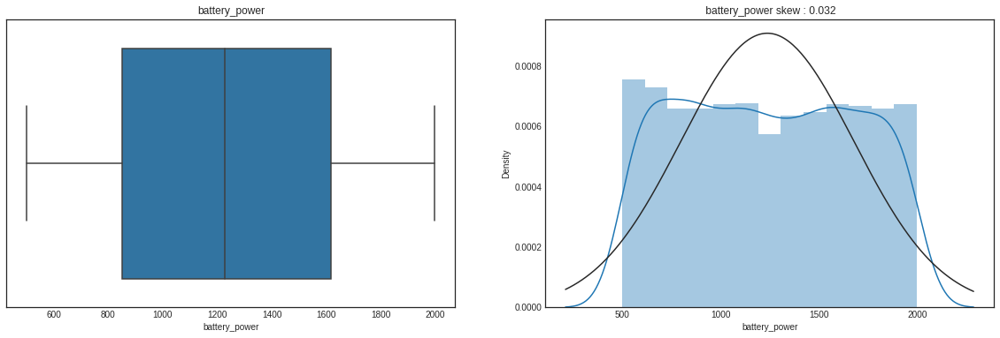

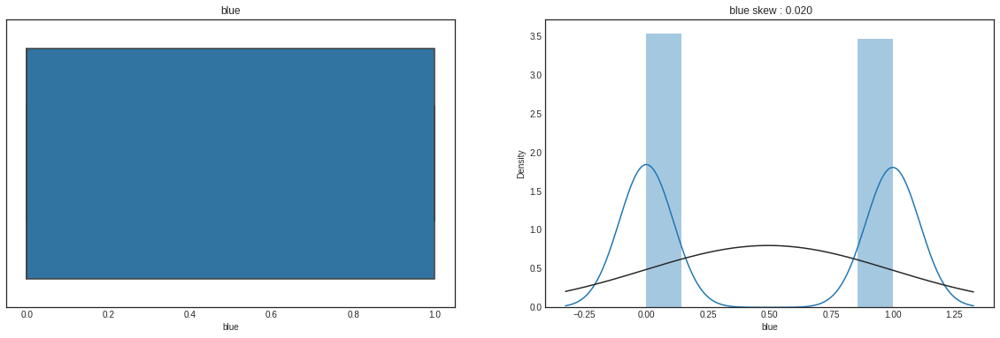

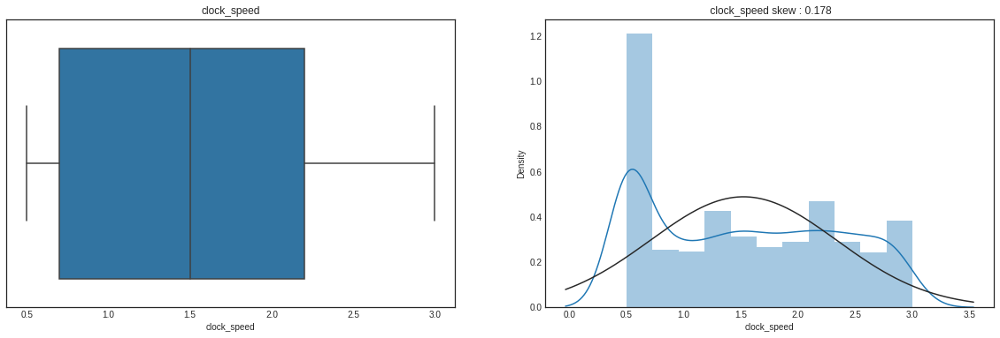

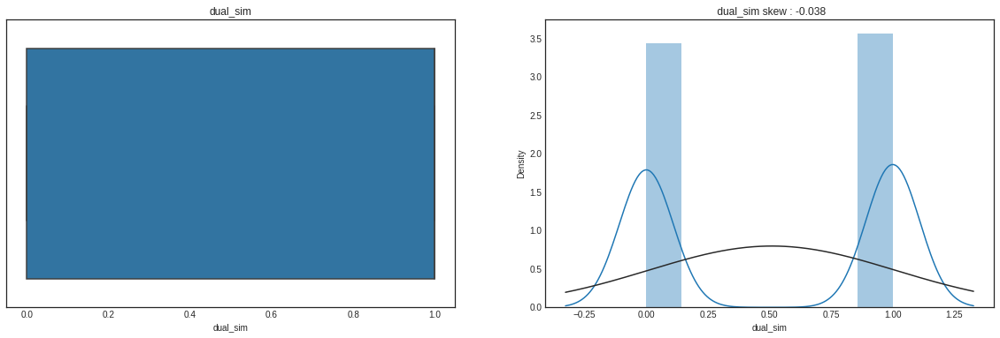

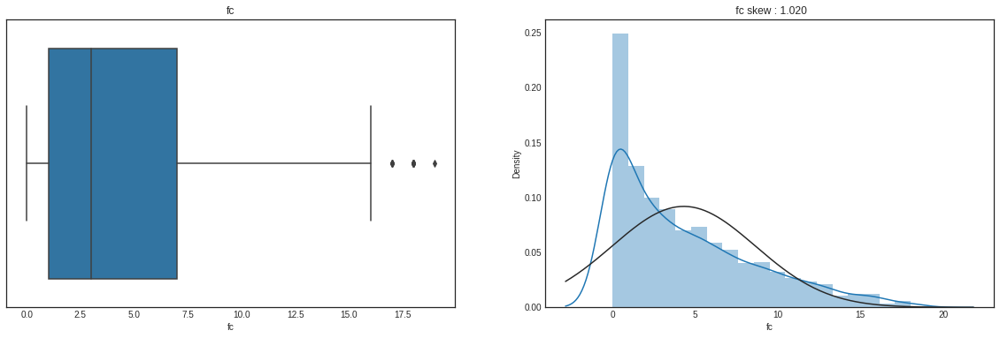

...

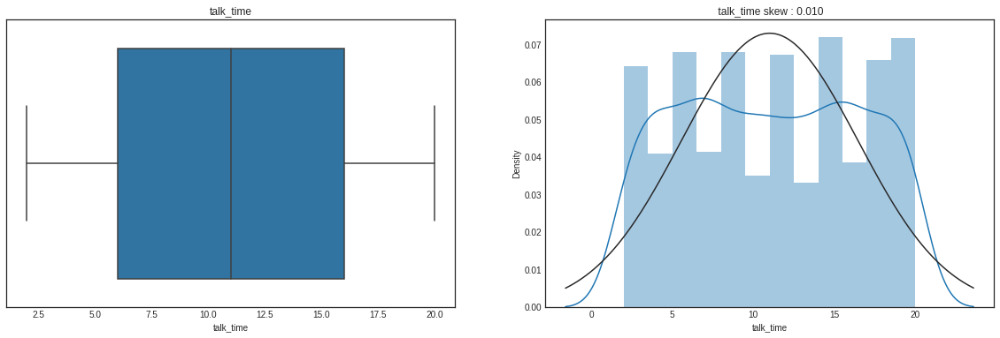

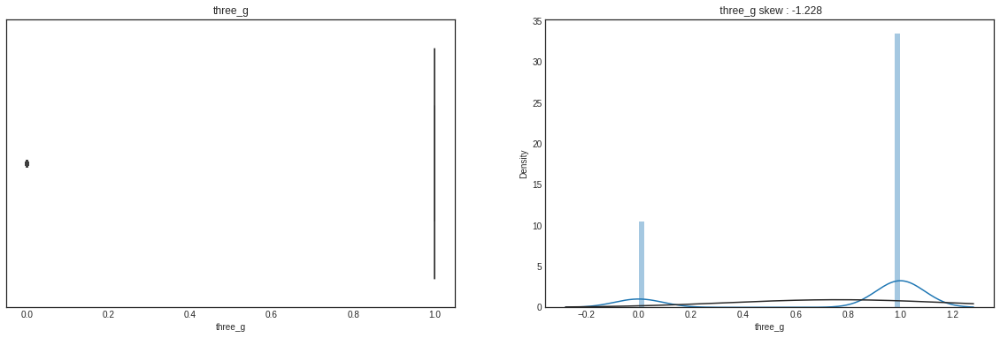

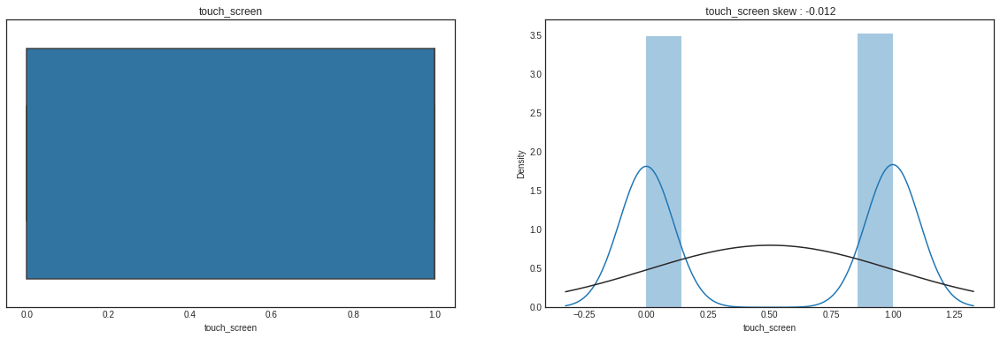

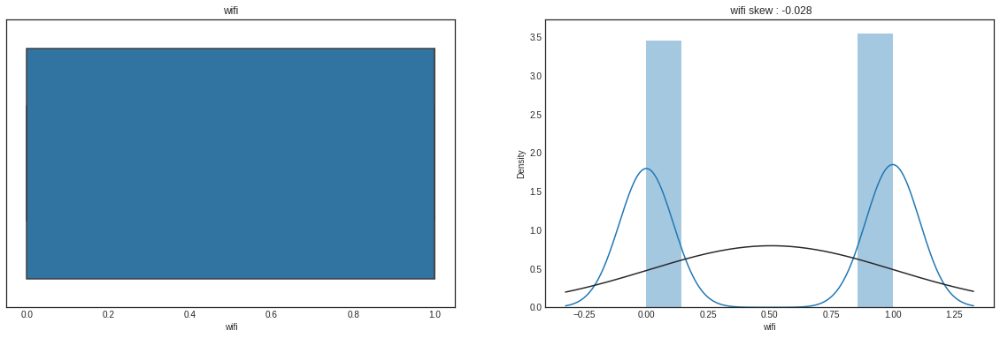

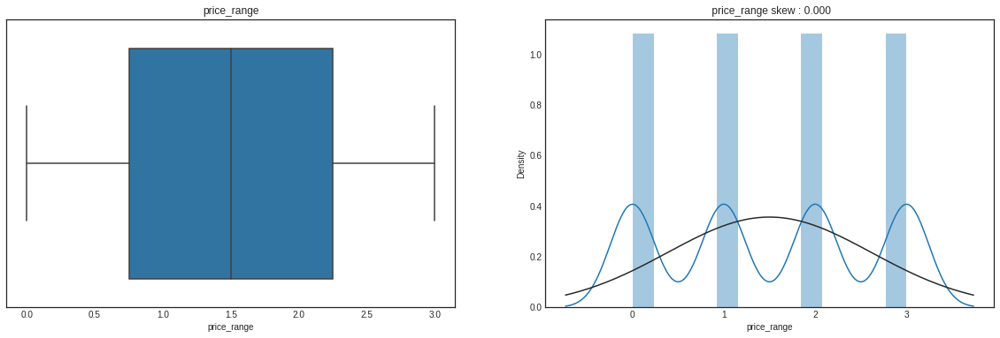

In [ ]:
# Chart - 18 visualization code

# Visualizing code of dist plot for each columns to know the data distibution
for col in ds.describe().columns:
  fig, (plot1, plot2) = plt.subplots(ncols = 2, figsize = (20, 6))
  sns.boxplot(ds[col], ax = plot1)
  plot1.set_title(col)

# Visualizing code of box plot for each columns to know the data distibution
  skew = ds[col].skew()
  sns.distplot(ds[col], fit = norm, ax=plot2)
  plot2.set_title(" %s skew : %.3f"%(col, skew))

##### 1. Why did you pick the specific chart?

The distplot or distribution plot, depicts the variation in the data distribution. It is used to summarize discrete or continuous data that are measured on an interval scale. It is often used to illustrate the major features of the distribution of the data in a convenient form. It is also useful when dealing with large data sets. It can help detect any unusual observations (outliers) or any gaps in the data.

Thus, I used the distplot plot to analysis the variable distributions over the whole dataset whether it's symmetric or not.

Box plots are used to show distributions of numeric data values, especially when you want to compare them between multiple groups. They are built to provide high-level information at a glance, offering general information about a group of data's symmetry, skew, variance, and outliers.

Thus, for each numerical varibale in the given dataset, I used box plot to analyse the outliers.

##### 2. What is/are the insight(s) found from the chart?

Almost all columns are symmetric distributed for numerical columns.

##### 3. Will the gained insights help creating a positive business impact? 
Are there any insights that lead to negative growth? Justify with specific reason.

Just a dist plot and box plot cannot define business impact. It's done just to see the distribution of the column data over the dataset.

#### Chart - 19 - Correlation Heatmap

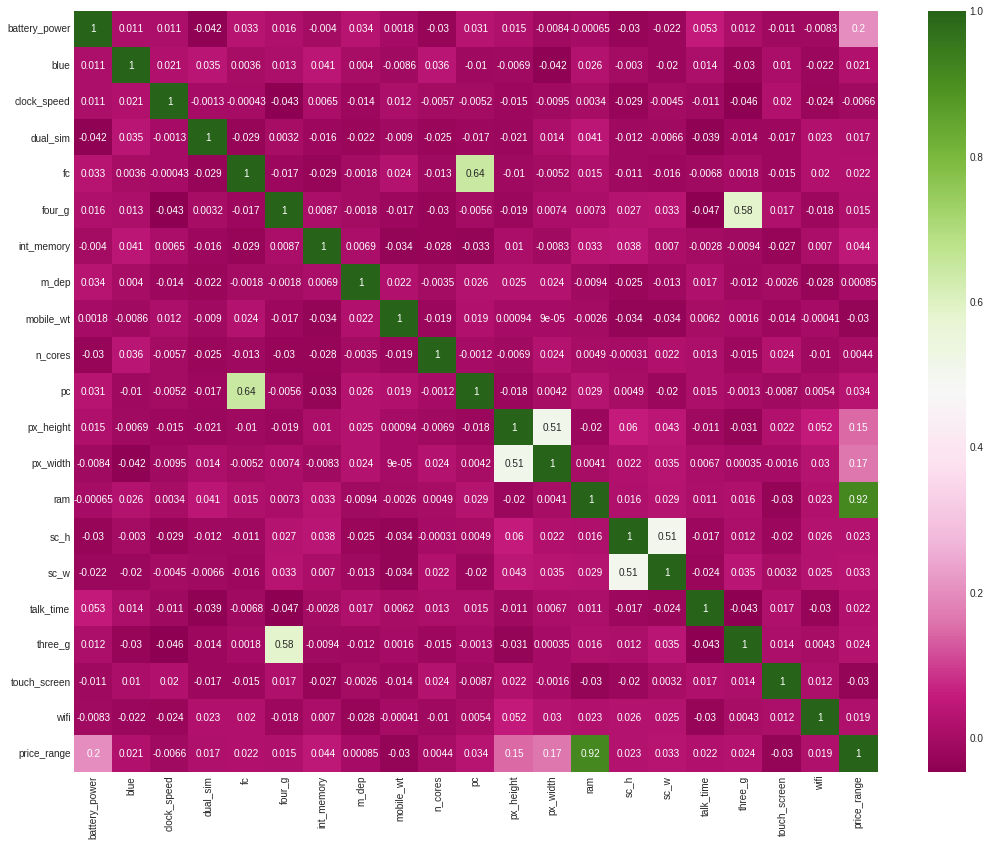

In [ ]:
# Chart - 19 visualization code
# Checking for multi-collinearity
correlation = ds.corr()
plt.figure(figsize = [18, 14])
sns.heatmap(correlation, cmap="PiYG", annot = True)

##### 1. Why did you pick the specific chart?

A heatmap isa graphical representation of data using colors to visualize the value of the matrix. In this, to represent more common values or higher activities brighter colors basically reddish colors are used and to represent less common or activity values, darker colors are preferred.

Thus to know the correlation between all the variables along with the correlation coeficients, i used correlation heatmap.

##### 2. What is/are the insight(s) found from the chart?

RAM and price_range shows high correlation which is a good sign, it signifies that RAM will play major deciding factor in estimating the price range.

There is some collinearity in feature pairs ('pc', 'fc'), ('px_width', 'px_height'), and ('sc_h', 'sc_h') .The ('pc', 'fc'), ('px_width', 'px_height'), and ('sc_h', 'sc_h') correlations are justified since there are good chances that if front camera of a phone is good, the back camera would also be good.

Also, if sc_h increases, sc_w increases, px_height increases, pixel width also increases, that means the overall pixels in the screen. We can replace these four features with two feature. Front Camera megapixels and Primary camera megapixels are different entities despite of showing colinearity. So we'll be keeping them as they are.

In [ ]:
#  defining new variable for screen_size and fixel_size
ds['screen_size'] = ds['sc_h'] * ds['sc_w']
ds['pixel_size'] = ds['px_height'] * ds['px_width']
# Dropping px_height and px_width

ds.drop(['sc_h', 'sc_w', 'px_height', 'px_width'], axis = 1, inplace = True)

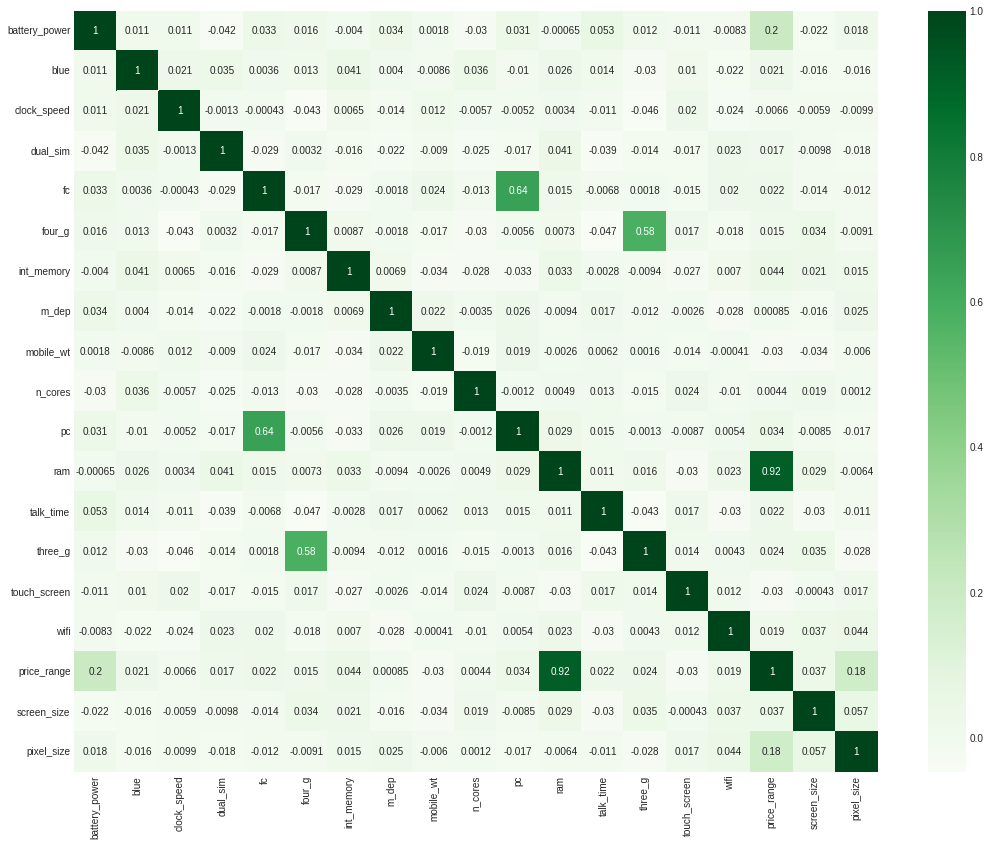

In [ ]:
# Checking for multi-collinearity
correlation = ds.corr()
plt.figure(figsize = [18, 14])
sns.heatmap(correlation, cmap="Greens", annot = True)

#### Chart - 20 -  Pair Plot

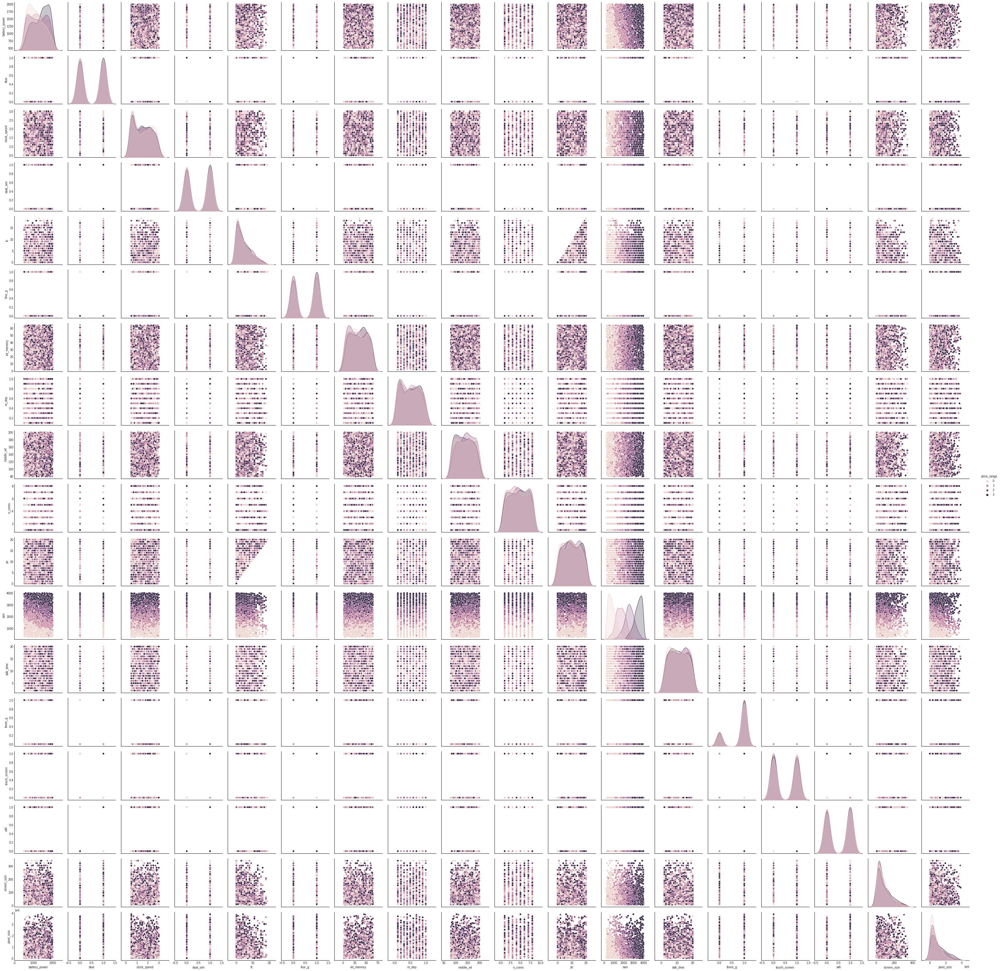

In [ ]:
#Pair Plot visualization code
sns.pairplot(ds, hue='price_range')

##### 1. Why did you pick the specific chart?

Pair plot is used to understand the best set of features to explain a relationship between two variables or to form the most separated clusters. It also helps to form some simple classification models by drawing some simple lines or make linear separation in our data-set.

Thus, I used pair plot to analyse the patterns of data and realationship between the features. It's exactly same as the correlation map but here you will get the graphical representation.

##### 2. What is/are the insight(s) found from the chart?

From the above chart I got to know, there are no much outliers.

## ***5. Hypothesis Testing***

### Based on your chart experiments, define three hypothetical statements from the dataset. In the next three questions, perform hypothesis testing to obtain final conclusion about the statements through your code and statistical testing.

1. Mobiles in the mid-price range have an average of at least 2000 MB of RAM.
2. Mobiles in the higher price range have an average maximum battery power of 1000 mAh.
3. Mobiles in the very high price range have an average primary camera of 10 mega pixels.

In [ ]:
# Creating Parameter Class 
class findz:
  def proportion(self,sample,hyp,size):
    return (sample - hyp)/math.sqrt(hyp*(1-hyp)/size)
  def mean(self,hyp,sample,size,std):
    return (sample - hyp)*math.sqrt(size)/std
  def varience(self,hyp,sample,size):
    return (size-1)*sample/hyp

variance = lambda x : sum([(i - np.mean(x))**2 for i in x])/(len(x)-1)
zcdf = lambda x: norm(0,1).cdf(x)
# Creating a function for getting P value
def p_value(z,tailed,t,hypothesis_number,df,col):
  if t!="true":
    z=zcdf(z)
    if tailed=='l':
      return z
    elif tailed == 'r':
      return 1-z
    elif tailed == 'd':
      if z>0.5:
        return 2*(1-z)
      else:
        return 2*z
    else:
      return np.nan
  else:
    z,p_value=stats.ttest_1samp(df[col],hypothesis_number)
    return p_value
    
  


# Conclusion about the P - Value
def conclusion(p):
  significance_level = 0.05
  if p>significance_level:
    return f"Failed to reject the Null Hypothesis for p = {p}."
  else:
    return f"Null Hypothesis rejected Successfully for p = {p}"

# Initializing the class
findz = findz()

### Hypothetical Statement - 1

Mobiles in the mid-price range have an average of at least 2000 MB of RAM.

#### 1. State Your research hypothesis as a null hypothesis and alternate hypothesis.

Null Hypothesis: N = 2000

Alternate Hypothesis : N < 2000

Test Type: Left Tailed Test

#### 2. Perform an appropriate statistical test.

In [ ]:
# Perform Statistical Test to obtain P-Value
hypo_1=ds[(ds["price_range"]==1)]
# Getting the required parameter values for hypothesis testing
hypothesis_number = 2000
sample_mean = hypo_1["ram"].mean()
size = len(hypo_1)
std=(variance(hypo_1["ram"]))**0.5

In [ ]:
# Getting Z value
z = findz.mean(hypothesis_number,sample_mean,size,std)
# Getting P - Value
p = p_value(z=z,tailed='l',t='true',hypothesis_number=hypothesis_number,df=hypo_1,col="ram")
# Getting Conclusion
print(conclusion(p))

Null Hypothesis rejected Successfully for p = 5.424897065462854e-44


##### Which statistical test have you done to obtain P-Value?

I have used T-test as a statistical test to get the p-value and found that the null hypothesis is rejected and on average high price range mobiles have less than 2000 MB of RAM.

##### Why did you choose the specific statistical test?

Text(0.5, 1.0, ' price_range skew : 0.007')

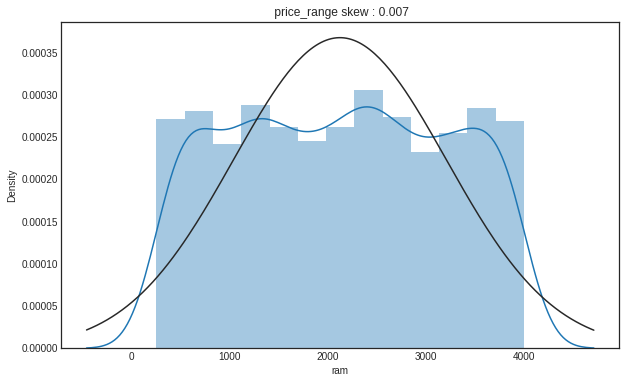

In [ ]:
# Visualizing code of dist plot for each columns to know the data distibution
fig, (ax) = plt.subplots(ncols = 1, figsize = (10, 6))

skew = ds['ram'].skew()
sns.distplot(ds['ram'], fit = norm, ax=ax)
ax.set_title(" %s skew : %.3f"%(col, skew))

In [ ]:
mean_median_difference=hypo_1["ram"].median()- hypo_1["ram"].mean()
print("Mean Median Difference is :-",mean_median_difference)

Mean Median Difference is :- 7.009999999999991


From the above chart we can see median is less than mean over 7. So, the distribution is postively skewed. For a skewed data Z-Test can't be performed.

Non-parametric tests are most useful for small studies. Using non-parametric tests in large studies may provide answers to the wrong question, thus confusing readers. For studies with a large sample size, t-tests and their corresponding confidence intervals can and should be used even for heavily skewed data.

So, for a skewed data we can use T-test for better result. Thus, I used t - test.

### Hypothetical Statement - 2

Mobiles in the higher price range have an average maximum battery power of 1000 mAh.

#### 1. State Your research hypothesis as a null hypothesis and alternate hypothesis.

Null Hypothesis: N = 1000

Alternate Hypothesis : N > 1000

Test Type: Right Tailed Test

#### 2. Perform an appropriate statistical test.

In [ ]:
# Perform Statistical Test to obtain P-Value
hypo_2 = ds[(ds["price_range"]==2)]
# Getting the required parameter values for hypothesis testing
hypothesis_number = 1000
sample_mean = hypo_2["battery_power"].mean()
size = len(hypo_2)
std=(variance(hypo_2["battery_power"]))**0.5

In [ ]:
# Getting Z value
z = findz.mean(hypothesis_number,sample_mean,size,std)
# Getting P - Value
p = p_value(z=z,tailed='r',t='true',hypothesis_number=hypothesis_number,df=hypo_2,col="battery_power")
# Getting Conclusion
print(conclusion(p))

Null Hypothesis rejected Successfully for p = 2.0424813917644103e-26


##### Which statistical test have you done to obtain P-Value?

I have used T-test as a statistical test to get the p-value and found that the null hypothesis is rejected and the average maximum battery of mobiles in high price range is more than 1000 mAh

##### Why did you choose the specific statistical test?

Text(0.5, 1.0, ' battery_power skew : 0.032')

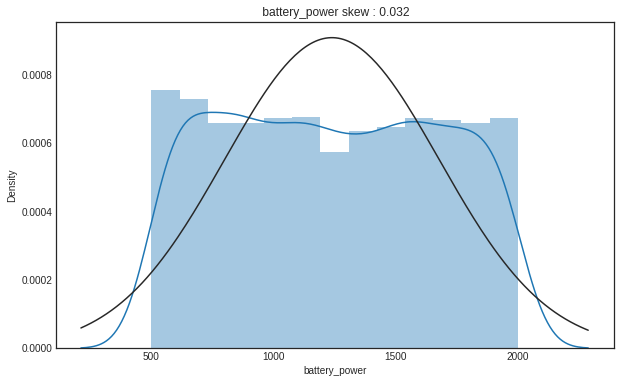

In [ ]:
# Visualizing code of dist plot for each columns to know the data distibution
fig, (ax) = plt.subplots(ncols = 1, figsize = (10, 6))

skew = ds['battery_power'].skew()
sns.distplot(ds['battery_power'], fit = norm, ax=ax)
ax.set_title(" %s skew : %.3f"%('battery_power', skew))

In [ ]:
mean_median_difference=hypo_2["battery_power"].median()- hypo_2["battery_power"].mean()
print("Mean Median Difference is :-",mean_median_difference)

Mean Median Difference is :- -8.819999999999936


From the above chart we can see median is less than mean over 8. So, the distribution is postively skewed. For a skewed data Z-Test can't be performed.

Non-parametric tests are most useful for small studies. Using non-parametric tests in large studies may provide answers to the wrong question, thus confusing readers. For studies with a large sample size, t-tests and their corresponding confidence intervals can and should be used even for heavily skewed data.

So, for a skewed data we can use T-test for better result. Thus, I used t - test.

### Hypothetical Statement - 3

Mobiles in the very high price range have an average primary camera of 10 mega pixels.

#### 1. State Your research hypothesis as a null hypothesis and alternate hypothesis.

Null Hypothesis: N = 10

Alternate Hypothesis : N != 10

Test Type: Two Tailed Test

#### 2. Perform an appropriate statistical test.

In [ ]:
# Perform Statistical Test to obtain P-Value
hypo_3=ds[(ds["price_range"]== 3)]
# Getting the required parameter values for hypothesis testing
hypothesis_number_3 = 10
sample_mean_3 = hypo_3["pc"].mean()
size_3 = len(hypo_1)
std_3=(variance(hypo_3["pc"]))**0.5

In [ ]:
# Getting Z value
z = findz.mean(hypothesis_number_3,sample_mean_3,size_3,std_3)
# Getting P - Value
p = p_value(z=z,tailed='d',t='false',hypothesis_number=hypothesis_number_3,df=hypo_3,col="pc")
# Getting Conclusion
print(conclusion(p))

Failed to reject the Null Hypothesis for p = 0.5815233046743389.


##### Which statistical test have you done to obtain P-Value?

I have used the Z-test as a statistical test to get the p-value and found that the null hypothesis fails to be rejected and Mobiles in the very high price range have an average primary camera of 10 mega pixels.

##### Why did you choose the specific statistical test?

Text(0.5, 1.0, ' primary camera skew : 0.017')

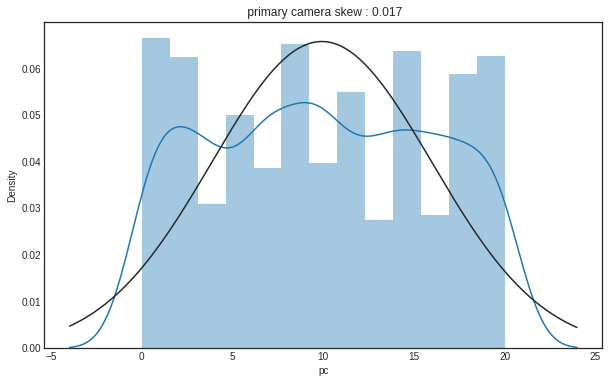

In [ ]:
# Visualizing code of dist plot for each columns to know the data distibution
fig, (ax) = plt.subplots(ncols = 1, figsize = (10, 6))

skew = ds['pc'].skew()
sns.distplot(ds['pc'], fit = norm, ax=ax)
ax.set_title(" %s skew : %.3f"%('primary camera', skew))

In [ ]:
mean_median_difference=hypo_3["pc"].median()- hypo_2["pc"].mean()
print("Mean Median Difference is :-",mean_median_difference)

Mean Median Difference is :- -0.018000000000000682


As shown above the Mean median difference is around 0.01 and nearly zero. Mean is approximately same as the median. Thus, it is a Normal Distribution. That's why I have used Z-Test directly

## ***6. Feature Engineering & Data Pre-processing***

### 1. Handling Missing Values

battery_power    0
blue             0
clock_speed      0
dual_sim         0
fc               0
four_g           0
int_memory       0
m_dep            0
mobile_wt        0
n_cores          0
pc               0
ram              0
talk_time        0
three_g          0
touch_screen     0
wifi             0
price_range      0
screen_size      0
pixel_size       0
dtype: int64


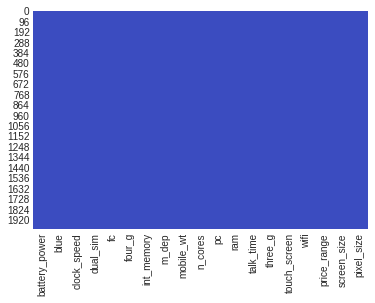

In [ ]:
# Handling Missing Values & Missing Value Imputation
# Missing Values/Null Values Count
print(ds.isnull().sum())

# Visualizing the missing values
# Checking Null Value by plotting Heatmap
sns.heatmap(ds.isnull(), cbar=False, cmap='coolwarm')

#### What all missing value imputation techniques have you used and why did you use those techniques?

There are no missing values to handle in the given dataset.

### 2. Handling Outliers

##### What all outlier treatment techniques have you used and why did you use those techniques?

There are no much outliesr columns in the given dataset which I am working on. So, Skipping this part.

### 3. Categorical Encoding

#### What all categorical encoding techniques have you used & why did you use those techniques?

There are I have already encoded data. So, Skipping this part.

### 4. Data Transformation

#### Do you think that your data needs to be transformed? If yes, which transformation have you used. Explain Why?

I think there is no need to change our data.

### 5. Data Scaling

In [ ]:
# Scaling your data
X = ds.drop("price_range",axis=1)
scaler = StandardScaler()
X_scaled = scaler.fit_transform(X)

In [ ]:
X_scaled

array([[-0.90259726, -0.9900495 ,  0.83077942, ...,  0.98609664,
        -0.29890576, -1.07303316],
       [-0.49513857,  1.0100505 , -1.2530642 , ..., -1.01409939,
        -0.46209733,  1.07754147],
       [-1.5376865 ,  1.0100505 , -1.2530642 , ..., -1.01409939,
        -0.85647695,  1.52135531],
       ...,
       [ 1.53077336, -0.9900495 , -0.76274805, ..., -1.01409939,
        -1.03326782,  0.61637375],
       [ 0.62252745, -0.9900495 , -0.76274805, ...,  0.98609664,
         1.29221204, -0.81988539],
       [-1.65833069,  1.0100505 ,  0.58562134, ...,  0.98609664,
        -0.12211489, -0.65225095]])

##### Which method have you used to scale you data and why?

When you are using an algorithm that assumes your features have a similar range, you should use feature scaling.

If the ranges of your features differ much then you should use feature scaling. If the range does not vary a lot like one of them is between 0 and 2 and the other one is between -1 and 0.5 then you can leave them as it's. However, you should use feature scaling if the ranges are, for example, between -2 and 2 and between -100 and 100.

Use Standardization when your data follows Gaussian or Normal distribution.
Use Normalization when your data does not follow Gaussian or Normal distribution.


That's why, I have used standardization using Satandardscaler.

### 6. Dimesionality Reduction

##### Do you think that dimensionality reduction is needed? Explain Why?

As per my knowledge, for this dataset dimensionality reduction is not required.

Essentially where high dimensions are a problem or where it is a particular point in the algorithm to dimension reduction.

Hard rules are hard to state, other than “after you have tried it, did it improve matters”, which isn’t always the most useful guidance.

Instead, looking at why we might want to do this we can get a bit of insight. Admittedly some of the following might blur together a bit at the edges but the aim is to give a flavour.

Our data are too big. 4 million rows. 50,000 columns… is there a lot of redundancy there? Building a model on this could be very expensive. Even relatively simple dimension reduction techniques like PCA can capture almost all of the information in a fraction of the memory if there are strong relationships (that can be linearly approximated) in the data.

We are over-fitting. If you build a model with tens of thousands of degrees of freedom but don’t have a lot of examples you can easily overfit. Dimension reduction is one way of handling this, though often not the the best

We want to bring in external data. OK, this is a bit different but worth a note. In applications like word2vec we want to build a classifier using an embedding. We may want to classify some text into different categories but with only a limited number of examples. The complexity of free text is vast but a low dimension embedding is much smaller and will not overfit so badly in a classifier. Building a low dimensional embedding on external text, applying it to the text to be classified then building a classifier is using dimension reduction to bring in external data.

We suffer from the curse of dimesnionality. Consider something like a nearest neighbour search. As the number of dimensions gets large we see some unwanted behaviour, especially if we are looking at things like euclidean distances. Projecting your data to a lower dimensional space for nearest neighbour, clustering or outlier detection can be both more robust and more meaningful.

Some tools are all about this. Collaborative filtering through matrix factorisation is an example. Can we approximately describe behaviour as a linear combination of a smaller number of preferences/behaviours?

### 7. Data Splitting

In [ ]:
# Split your data to train and test. Choose Splitting ratio wisely.
# split into 75:25 ratio
y = ds["price_range"]
X_train, X_test, y_train, y_test = train_test_split(X_scaled, y, test_size = 0.25, random_state = 0)
  
# describes info about train and test set
print("X_train dataset: ", X_train.shape)
print("y_train dataset: ", y_train.shape)
print("X_test dataset: ", X_test.shape)
print("y_test dataset: ", y_test.shape)

X_train dataset:  (1500, 18)
y_train dataset:  (1500,)
X_test dataset:  (500, 18)
y_test dataset:  (500,)


##### What data splitting ratio have you used and why? 

There are two competing concerns: with less training data, your parameter estimates have greater variance. With less testing data, your performance statistic will have greater variance. Broadly speaking you should be concerned with dividing data such that neither variance is too high, which is more to do with the absolute number of instances in each category rather than the percentage.

If you have a total of 100 instances, you're probably stuck with cross validation as no single split is going to give you satisfactory variance in your estimates. If you have 100,000 instances, it doesn't really matter whether you choose an 80:20 split or a 90:10 split (indeed you may choose to use less training data if your method is particularly computationally intensive).

You'd be surprised to find out that 80/20 is quite a commonly occurring ratio, often referred to as the Pareto principle. It's usually a safe bet if you use that ratio.

In this case the training dataset is small, that's why I have taken 75:25 ratio.

### 8. Handling Imbalanced Dataset

1    500
2    500
3    500
0    500
Name: price_range, dtype: int64


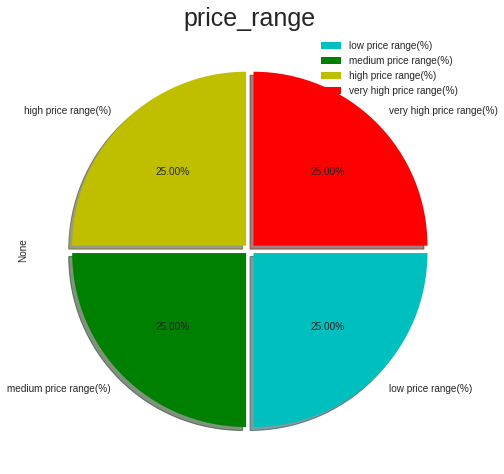

In [ ]:
# Dependant variable Value Counts
print(ds['price_range'].value_counts())

# Dependant Variable Visualization use a pie chart
plt.figure(figsize=(8,8))
(ds[['price_range']].value_counts(normalize=True)*[100]).plot(kind='pie', 
                                                              autopct='%1.2f%%', 
                                                              textprops={'fontsize': 10},
                                                              labels=['low price range(%)','medium price range(%)',
                                                                       'high price range(%)','very high price range(%)'],
                                                              colors = ['c','g','y','r'],
                                                              explode =[0.03, 0.03, 0.03, 0.03],
                                                              shadow=True, counterclock=False)
plt.title('price_range',fontsize = 25)
plt.legend(fontsize = 10)
plt.show()


##### Do you think the dataset is imbalanced? Explain Why.

There are I have balanced data. So, Skipping this part.

## ***7. ML Model Implementation***

### ML Model - 1 - **Implementing Decision Tree Classifier**



In [ ]:
# ML Model - 1 Implementation
dtclf = DecisionTreeClassifier(random_state=0)
# Fit the Algorithm
dtclf.fit(X_train, y_train)

DecisionTreeClassifier(random_state=0)

In [ ]:
# Predict on the model
# Making predictions on train and test data
train_class_preds = dtclf.predict(X_train)
test_class_preds = dtclf.predict(X_test)

In [ ]:
accuracy_score(y_test, test_class_preds)

0.832

In [ ]:
# Calculating accuracy on train and test
train_accuracy = accuracy_score(y_train, train_class_preds)
test_accuracy = accuracy_score(y_test,test_class_preds)

print("The accuracy on train dataset is", train_accuracy)
print("The accuracy on test dataset is", test_accuracy)

The accuracy on train dataset is 1.0
The accuracy on test dataset is 0.832


#### 1. Explain the ML Model used and it's performance using Evaluation metric Score Chart.

[[376   0   0   0]
 [  0 390   0   0]
 [  0   0 375   0]
 [  0   0   0 359]]


Text(0.5, 1.0, 'Confusion Matrix')

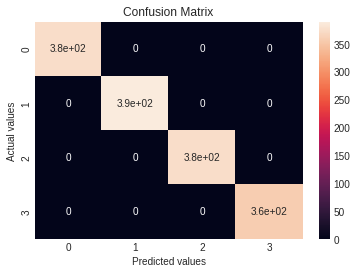

In [ ]:
# Get the confusion matrix for both train and test
cm = confusion_matrix(y_train, train_class_preds)
print(cm)

ax= plt.subplot()
sns.heatmap(cm, annot=True, ax = ax) #annot=True to annotate cells

# labels, title and ticks
ax.set_xlabel('Predicted values')
ax.set_ylabel('Actual values')
ax.set_title('Confusion Matrix')

[[109  15   0   0]
 [  8  86  16   0]
 [  0  14  95  16]
 [  0   0  15 126]]


Text(0.5, 1.0, 'Confusion Matrix')

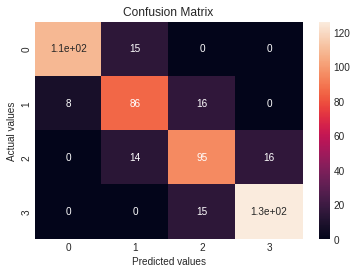

In [ ]:
# Get the confusion matrix for both train and test
cm = confusion_matrix(y_test, test_class_preds)
print(cm)

ax= plt.subplot()
sns.heatmap(cm, annot=True, ax = ax) #annot=True to annotate cells

# labels, title and ticks
ax.set_xlabel('Predicted values')
ax.set_ylabel('Actual values')
ax.set_title('Confusion Matrix')

In [ ]:
print(classification_report(train_class_preds, y_train))

              precision    recall  f1-score   support

           0       1.00      1.00      1.00       376
           1       1.00      1.00      1.00       390
           2       1.00      1.00      1.00       375
           3       1.00      1.00      1.00       359

    accuracy                           1.00      1500
   macro avg       1.00      1.00      1.00      1500
weighted avg       1.00      1.00      1.00      1500



In [ ]:
print(classification_report(test_class_preds, y_test))

              precision    recall  f1-score   support

           0       0.88      0.93      0.90       117
           1       0.78      0.75      0.76       115
           2       0.76      0.75      0.76       126
           3       0.89      0.89      0.89       142

    accuracy                           0.83       500
   macro avg       0.83      0.83      0.83       500
weighted avg       0.83      0.83      0.83       500



I used Decision Tree algorithm to create the model. As I got there is overfitting seen.

For training dataset, 
*   precision of 100% and recall of 100% and f1-score of 100% for Low price range mobile data.
*   precision of 100% and recall of 100% and f1-score of 100% for Medium price range mobile data.
*   precision of 100% and recall of 100% and f1-score of 100% for High price range mobile data.
*   precision of 100% and recall of 100% and f1-score of 100% for Very high price range mobile data.
*   Accuracy is 100% and average percision, recall & f1_score are 100%, 100% and 100% respectively.

For testing dataset,
*  precision of 88% and recall of 93% and f1-score of 90% for Low price range mobile data. 
*   precision of 78% and recall of 75% and f1-score of 76% for Medium price range mobile data. 
*   precision of 76% and recall of 75% and f1-score of 76% for High price range mobile data.
*   precision of 89% and recall of 89% and f1-score of 89% for Very high price range mobile data. 
*   Accuracy is 83% and average percision, recall & f1_score are 83%, 83% and 83% respectively.



Next tryting to improving the score by using hyperparameter tuning technique.

In [ ]:
feature_imp_df = pd.DataFrame({'Feature' : list(X.columns),
                               'Feature Importance_score' : dtclf.feature_importances_}
                              ).sort_values(by='Feature Importance_score', 
                                            ascending=False).reset_index(drop=True)
                                            
feature_imp_df['Feature Importance_score'] = round(feature_imp_df['Feature Importance_score'],2)

In [ ]:
feature_imp_df

,Feature,Feature Importance_score
0,ram,0.65
1,battery_power,0.13
2,pixel_size,0.13
3,mobile_wt,0.03
4,m_dep,0.01
5,screen_size,0.01
6,n_cores,0.01
7,int_memory,0.01
8,fc,0.01
9,pc,0.00


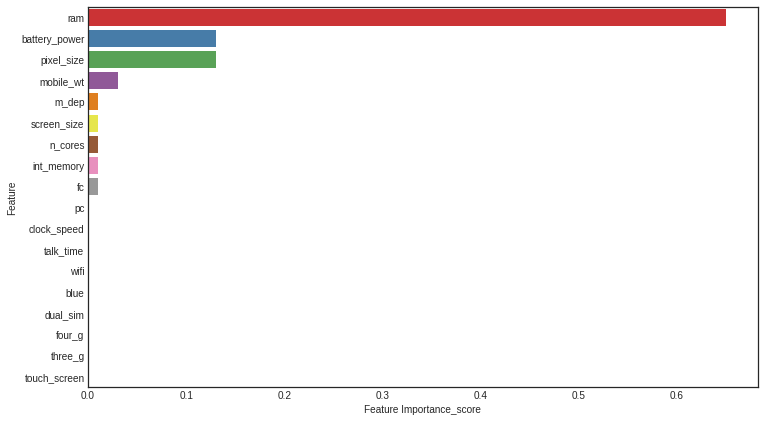

In [ ]:
fig, ax = plt.subplots(figsize=(12,7))
ax = sns.barplot(x=feature_imp_df['Feature Importance_score'], 
                 y=feature_imp_df['Feature'],
                 palette = "Set1")
plt.show()

#### 2. Cross- Validation & Hyperparameter Tuning

In [ ]:
# ML Model - 1 Implementation with hyperparameter optimization techniques (i.e., GridSearch CV, RandomSearch CV, Bayesian Optimization etc.)
dt_model = DecisionTreeClassifier(random_state=0)

param_grid = {'max_depth': [5, 10, 15, 20, 30], 
              'max_leaf_nodes': [10, 20, 30, 50, 100]}

grid = GridSearchCV(estimator=dt_model, 
                    param_grid = param_grid, 
                    scoring = 'accuracy', 
                    cv = 20, verbose = 24)
# Fit the Algorithm
grid_result=grid.fit(X_train, y_train)


Fitting 20 folds for each of 25 candidates, totalling 500 fits
[CV 1/20; 1/25] START max_depth=5, max_leaf_nodes=10............................
[CV 1/20; 1/25] END max_depth=5, max_leaf_nodes=10;, score=0.773 total time=   0.0s
[CV 2/20; 1/25] START max_depth=5, max_leaf_nodes=10............................
[CV 2/20; 1/25] END max_depth=5, max_leaf_nodes=10;, score=0.853 total time=   0.0s
[CV 3/20; 1/25] START max_depth=5, max_leaf_nodes=10............................
[CV 3/20; 1/25] END max_depth=5, max_leaf_nodes=10;, score=0.787 total time=   0.0s
[CV 4/20; 1/25] START max_depth=5, max_leaf_nodes=10............................
[CV 4/20; 1/25] END max_depth=5, max_leaf_nodes=10;, score=0.760 total time=   0.0s
[CV 5/20; 1/25] START max_depth=5, max_leaf_nodes=10............................
[CV 5/20; 1/25] END max_depth=5, max_leaf_nodes=10;, score=0.813 total time=   0.0s
[CV 6/20; 1/25] START max_depth=5, max_leaf_nodes=10............................
[CV 6/20; 1/25] END max_depth=5

In [ ]:
print("Best: %f using %s" % (grid_result.best_score_, grid_result.best_params_))

Best: 0.859333 using {'max_depth': 10, 'max_leaf_nodes': 50}


In [ ]:
# Predict on the model
# Get the predicted classes
train_class_preds = grid_result.predict(X_train)
test_class_preds = grid_result.predict(X_test)

In [ ]:
# Calculating accuracy on train and test
train_accuracy = accuracy_score(y_train, train_class_preds)
test_accuracy = accuracy_score(y_test,test_class_preds)

print("The accuracy on train dataset is", train_accuracy)
print("The accuracy on test dataset is", test_accuracy)

The accuracy on train dataset is 0.9433333333333334
The accuracy on test dataset is 0.852


[[359  17   0   0]
 [ 12 370   8   0]
 [  0  22 341  12]
 [  0   0  14 345]]


Text(0.5, 1.0, 'Confusion Matrix')

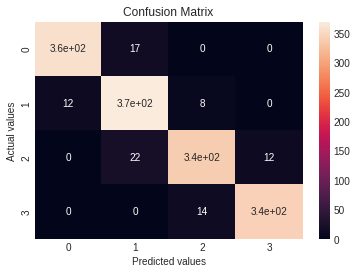

In [ ]:
# Get the confusion matrix for both train and test
cm = confusion_matrix(y_train, train_class_preds)
print(cm)

ax= plt.subplot()
sns.heatmap(cm, annot=True, ax = ax) #annot=True to annotate cells

# labels, title and ticks
ax.set_xlabel('Predicted values')
ax.set_ylabel('Actual values')
ax.set_title('Confusion Matrix')

[[113  11   0   0]
 [  8  92  10   0]
 [  0  15  94  16]
 [  0   0  14 127]]


Text(0.5, 1.0, 'Confusion Matrix')

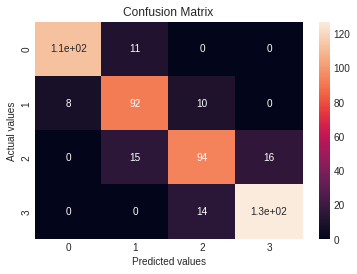

In [ ]:
# Get the confusion matrix for both train and test
cm = confusion_matrix(y_test, test_class_preds)
print(cm)

ax= plt.subplot()
sns.heatmap(cm, annot=True, ax = ax) #annot=True to annotate cells

# labels, title and ticks
ax.set_xlabel('Predicted values')
ax.set_ylabel('Actual values')
ax.set_title('Confusion Matrix')

In [ ]:
print(classification_report(train_class_preds, y_train))

              precision    recall  f1-score   support

           0       0.95      0.97      0.96       371
           1       0.95      0.90      0.93       409
           2       0.91      0.94      0.92       363
           3       0.96      0.97      0.96       357

    accuracy                           0.94      1500
   macro avg       0.94      0.94      0.94      1500
weighted avg       0.94      0.94      0.94      1500



In [ ]:
print(classification_report(test_class_preds, y_test))

              precision    recall  f1-score   support

           0       0.91      0.93      0.92       121
           1       0.84      0.78      0.81       118
           2       0.75      0.80      0.77       118
           3       0.90      0.89      0.89       143

    accuracy                           0.85       500
   macro avg       0.85      0.85      0.85       500
weighted avg       0.85      0.85      0.85       500



##### Which hyperparameter optimization technique have you used and why?

GridSearchCV which uses the Grid Search technique for finding the optimal hyperparameters to increase the model performance.

our goal should be to find the best hyperparameters values to get the perfect prediction results from our model. But the question arises, how to find these best sets of hyperparameters? One can try the Manual Search method, by using the hit and trial process and can find the best hyperparameters which would take huge time to build a single model.

For this reason, methods like Random Search, GridSearch were introduced. Grid Search uses a different combination of all the specified hyperparameters and their values and calculates the performance for each combination and selects the best value for the hyperparameters. This makes the processing time-consuming and expensive based on the number of hyperparameters involved.

In GridSearchCV, along with Grid Search, cross-validation is also performed. Cross-Validation is used while training the model.

That's why I have used GridsearCV method for hyperparameter optimization.

##### Have you seen any improvement? Note down the improvement with updates Evaluation metric Score Chart.

For training dataset, 
*   precision of 95% and recall of 97% and f1-score of 96% for Low price range mobile data.
*   precision of 95% and recall of 90% and f1-score of 93% for Medium price range mobile data.
*   precision of 91% and recall of 94% and f1-score of 92% for High price range mobile data.
*   precision of 96% and recall of 97% and f1-score of 96% for Very high price range mobile data.
*   Accuracy is 94% and average percision, recall & f1_score are 94%, 94% and 94% respectively.

Quite improvment seen as no overfitting but the scores reduced by some percentages.

For testing dataset, 
*   precision of 91% and recall of 93% and f1-score of 92% for Low price range mobile data.
*   precision of 84% and recall of 78% and f1-score of 81% for Medium price range mobile data.
*   precision of 75% and recall of 80% and f1-score of 77% for High price range mobile data.
*   precision of 90% and recall of 89% and f1-score of 89% for Very high price range mobile data.
*   Accuracy is 85% and average percision, recall & f1_score are 85%, 85% and 85% respectively.

Quite improvemnt seen in precsion, f1 score and recall increase by 2%.


### ML Model - 2 - **Implementing Logistic Regression**



In [ ]:
# ML Model - 1 Implementation
log_r = LogisticRegression(random_state=0)
# Fit the Algorithm
log_r.fit(X_train, y_train)

LogisticRegression(random_state=0)

In [ ]:
# Predict on the model
# Making predictions on train and test data
train_class_preds = log_r.predict(X_train)
test_class_preds = log_r.predict(X_test)

In [ ]:
accuracy_score(y_test, test_class_preds)

0.922

In [ ]:
# Calculating accuracy on train and test
train_accuracy = accuracy_score(y_train, train_class_preds)
test_accuracy = accuracy_score(y_test,test_class_preds)

print("The accuracy on train dataset is", train_accuracy)
print("The accuracy on test dataset is", test_accuracy)

The accuracy on train dataset is 0.9486666666666667
The accuracy on test dataset is 0.922


#### 1. Explain the ML Model used and it's performance using Evaluation metric Score Chart.

[[365  11   0   0]
 [ 13 366  11   0]
 [  0  19 346  10]
 [  0   0  13 346]]


Text(0.5, 1.0, 'Confusion Matrix')

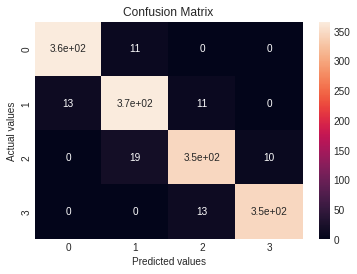

In [ ]:
# Get the confusion matrix for both train and test
cm = confusion_matrix(y_train, train_class_preds)
print(cm)

ax= plt.subplot()
sns.heatmap(cm, annot=True, ax = ax) #annot=True to annotate cells

# labels, title and ticks
ax.set_xlabel('Predicted values')
ax.set_ylabel('Actual values')
ax.set_title('Confusion Matrix')

[[121   3   0   0]
 [  3 101   6   0]
 [  0   6 109  10]
 [  0   0  11 130]]


Text(0.5, 1.0, 'Confusion Matrix')

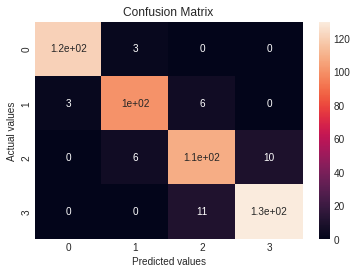

In [ ]:
# Get the confusion matrix for both train and test
cm = confusion_matrix(y_test, test_class_preds)
print(cm)

ax= plt.subplot()
sns.heatmap(cm, annot=True, ax = ax) #annot=True to annotate cells

# labels, title and ticks
ax.set_xlabel('Predicted values')
ax.set_ylabel('Actual values')
ax.set_title('Confusion Matrix')

In [ ]:
print(classification_report(train_class_preds, y_train))

              precision    recall  f1-score   support

           0       0.97      0.97      0.97       378
           1       0.94      0.92      0.93       396
           2       0.92      0.94      0.93       370
           3       0.96      0.97      0.97       356

    accuracy                           0.95      1500
   macro avg       0.95      0.95      0.95      1500
weighted avg       0.95      0.95      0.95      1500



In [ ]:
print(classification_report(test_class_preds, y_test))

              precision    recall  f1-score   support

           0       0.98      0.98      0.98       124
           1       0.92      0.92      0.92       110
           2       0.87      0.87      0.87       126
           3       0.92      0.93      0.93       140

    accuracy                           0.92       500
   macro avg       0.92      0.92      0.92       500
weighted avg       0.92      0.92      0.92       500



I used Logistic Regression algorithm to create the model. As I got good result.

For training dataset, 
*   precision of 97% and recall of 97% and f1-score of 97% for Low price range mobile data.
*   precision of 94% and recall of 92% and f1-score of 93% for Medium price range mobile data.
*   precision of 92% and recall of 94% and f1-score of 93% for High price range mobile data.
*   precision of 96% and recall of 97% and f1-score of 97% for Very high price range mobile data.
*   Accuracy is 95% and average percision, recall & f1_score are 95%, 95% and 95% respectively.

For testing dataset,
*  precision of 98% and recall of 98% and f1-score of 98% for Low price range mobile data. 
*   precision of 92% and recall of 92% and f1-score of 92% for Medium price range mobile data. 
*   precision of 87% and recall of 87% and f1-score of 87% for High price range mobile data.
*   precision of 92% and recall of 93% and f1-score of 93% for Very high price range mobile data. 
*   Accuracy is 92% and average percision, recall & f1_score are 92%, 92% and 92% respectively.

Next tryting to improving the score by using hyperparameter tuning technique.


#### 2. Cross- Validation & Hyperparameter Tuning

In [ ]:
# ML Model - 3 Implementation with hyperparameter optimization techniques (i.e., GridSearch CV, RandomSearch CV, Bayesian Optimization etc.)
lr_model = LogisticRegression(random_state=0)

param_grid = { 'penalty': ['l1', 'l2'], 'C': [1, 2, 3, 4, 5] }

grid = GridSearchCV(estimator=lr_model, 
                    param_grid = param_grid, 
                    scoring = 'accuracy', 
                    cv = 10, verbose = 10)
# Fit the Algorithm
grid_result=grid.fit(X_train, y_train)

Fitting 10 folds for each of 10 candidates, totalling 100 fits
[CV 1/10; 1/10] START C=1, penalty=l1...........................................
[CV 1/10; 1/10] END ..............C=1, penalty=l1;, score=nan total time=   0.0s
[CV 2/10; 1/10] START C=1, penalty=l1...........................................
[CV 2/10; 1/10] END ..............C=1, penalty=l1;, score=nan total time=   0.0s
[CV 3/10; 1/10] START C=1, penalty=l1...........................................
[CV 3/10; 1/10] END ..............C=1, penalty=l1;, score=nan total time=   0.0s
[CV 4/10; 1/10] START C=1, penalty=l1...........................................
[CV 4/10; 1/10] END ..............C=1, penalty=l1;, score=nan total time=   0.0s
[CV 5/10; 1/10] START C=1, penalty=l1...........................................
[CV 5/10; 1/10] END ..............C=1, penalty=l1;, score=nan total time=   0.0s
[CV 6/10; 1/10] START C=1, penalty=l1...........................................
[CV 6/10; 1/10] END ..............C=1, penalty

In [ ]:
print("Best: %f using %s" % (grid_result.best_score_, grid_result.best_params_))

Best: 0.931333 using {'C': 1, 'penalty': 'l2'}


In [ ]:
# Predict on the model
# Making predictions on train and test data
train_class_preds = log_r.predict(X_train)
test_class_preds = log_r.predict(X_test)

In [ ]:
# Calculating accuracy on train and test
train_accuracy = accuracy_score(y_train, train_class_preds)
test_accuracy = accuracy_score(y_test,test_class_preds)

print("The accuracy on train dataset is", train_accuracy)
print("The accuracy on test dataset is", test_accuracy)

The accuracy on train dataset is 0.9486666666666667
The accuracy on test dataset is 0.922


[[365  11   0   0]
 [ 13 366  11   0]
 [  0  19 346  10]
 [  0   0  13 346]]


Text(0.5, 1.0, 'Confusion Matrix')

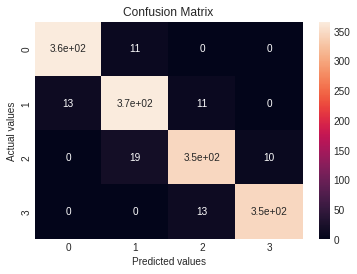

In [ ]:
# Get the confusion matrix for both train and test
cm = confusion_matrix(y_train, train_class_preds)
print(cm)

ax= plt.subplot()
sns.heatmap(cm, annot=True, ax = ax) #annot=True to annotate cells

# labels, title and ticks
ax.set_xlabel('Predicted values')
ax.set_ylabel('Actual values')
ax.set_title('Confusion Matrix')

[[121   3   0   0]
 [  3 101   6   0]
 [  0   6 109  10]
 [  0   0  11 130]]


Text(0.5, 1.0, 'Confusion Matrix')

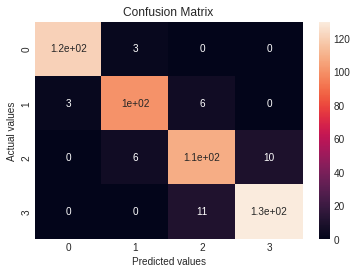

In [ ]:
# Get the confusion matrix for both train and test
cm = confusion_matrix(y_test, test_class_preds)
print(cm)

ax= plt.subplot()
sns.heatmap(cm, annot=True, ax = ax) #annot=True to annotate cells

# labels, title and ticks
ax.set_xlabel('Predicted values')
ax.set_ylabel('Actual values')
ax.set_title('Confusion Matrix')

In [ ]:
print(classification_report(train_class_preds, y_train))

              precision    recall  f1-score   support

           0       0.97      0.97      0.97       378
           1       0.94      0.92      0.93       396
           2       0.92      0.94      0.93       370
           3       0.96      0.97      0.97       356

    accuracy                           0.95      1500
   macro avg       0.95      0.95      0.95      1500
weighted avg       0.95      0.95      0.95      1500



In [ ]:
print(classification_report(test_class_preds, y_test))

              precision    recall  f1-score   support

           0       0.98      0.98      0.98       124
           1       0.92      0.92      0.92       110
           2       0.87      0.87      0.87       126
           3       0.92      0.93      0.93       140

    accuracy                           0.92       500
   macro avg       0.92      0.92      0.92       500
weighted avg       0.92      0.92      0.92       500



##### Which hyperparameter optimization technique have you used and why?

GridSearchCV which uses the Grid Search technique for finding the optimal hyperparameters to increase the model performance.

our goal should be to find the best hyperparameters values to get the perfect prediction results from our model. But the question arises, how to find these best sets of hyperparameters? One can try the Manual Search method, by using the hit and trial process and can find the best hyperparameters which would take huge time to build a single model.

For this reason, methods like Random Search, GridSearch were introduced. Grid Search uses a different combination of all the specified hyperparameters and their values and calculates the performance for each combination and selects the best value for the hyperparameters. This makes the processing time-consuming and expensive based on the number of hyperparameters involved.

In GridSearchCV, along with Grid Search, cross-validation is also performed. Cross-Validation is used while training the model.

That's why I have used GridsearCV method for hyperparameter optimization.

##### Have you seen any improvement? Note down the improvement with updates Evaluation metric Score Chart.

For training dataset, 
*   precision of 97% and recall of 97% and f1-score of 97% for Low price range mobile data.
*   precision of 94% and recall of 92% and f1-score of 93% for Medium price range mobile data.
*   precision of 92% and recall of 94% and f1-score of 93% for High price range mobile data.
*   precision of 96% and recall of 97% and f1-score of 97% for Very high price range mobile data.
*   Accuracy is 95% and average percision, recall & f1_score are 95%, 95% and 95% respectively.

No improvement or decreament every score is constant as earlier.

For testing dataset, 
*   precision of 98% and recall of 98% and f1-score of 98% for Low price range mobile data.
*   precision of 92% and recall of 92% and f1-score of 92% for Medium price range mobile data.
*   precision of 87% and recall of 87% and f1-score of 87% for High price range mobile data.
*   precision of 92% and recall of 93% and f1-score of 93% for Very high price range mobile data.
*   Accuracy is 92% and average percision, recall & f1_score are 92%, 92% and 92% respectively.

No improvement or decreament every score is constant as earlier.


### ML Model - 3 - **Implementing xgboost Classifier**



In [ ]:
# ML Model - 1 Implementation
xgbclf = XGBClassifier(random_state=0)

# Fit the Algorithm
xgbclf.fit(X_train, y_train)

XGBClassifier(objective='multi:softprob')

In [ ]:
# Predict on the model
# Making predictions on train and test data
train_class_preds = xgbclf.predict(X_train)
test_class_preds = xgbclf.predict(X_test)

In [ ]:
accuracy_score(y_test, test_class_preds)

0.904

In [ ]:
# Calculating accuracy on train and test
train_accuracy = accuracy_score(y_train, train_class_preds)
test_accuracy = accuracy_score(y_test,test_class_preds)

print("The accuracy on train dataset is", train_accuracy)
print("The accuracy on test dataset is", test_accuracy)

The accuracy on train dataset is 0.978
The accuracy on test dataset is 0.904


#### 1. Explain the ML Model used and it's performance using Evaluation metric Score Chart.

[[371   5   0   0]
 [  3 381   6   0]
 [  0  11 361   3]
 [  0   0   5 354]]


Text(0.5, 1.0, 'Confusion Matrix')

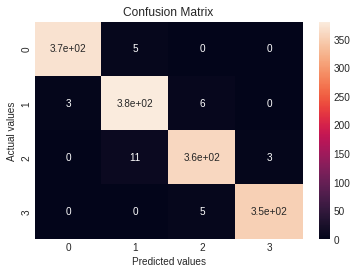

In [ ]:
# Get the confusion matrix for both train and test
cm = confusion_matrix(y_train, train_class_preds)
print(cm)

ax= plt.subplot()
sns.heatmap(cm, annot=True, ax = ax) #annot=True to annotate cells

# labels, title and ticks
ax.set_xlabel('Predicted values')
ax.set_ylabel('Actual values')
ax.set_title('Confusion Matrix')

[[123   1   0   0]
 [  9  91  10   0]
 [  0  12 105   8]
 [  0   0   8 133]]


Text(0.5, 1.0, 'Confusion Matrix')

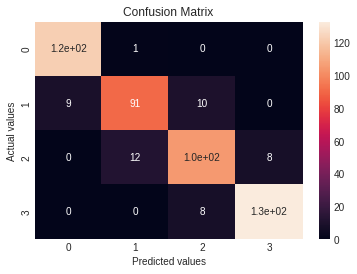

In [ ]:
# Get the confusion matrix for both train and test
cm = confusion_matrix(y_test, test_class_preds)
print(cm)

ax= plt.subplot()
sns.heatmap(cm, annot=True, ax = ax) #annot=True to annotate cells

# labels, title and ticks
ax.set_xlabel('Predicted values')
ax.set_ylabel('Actual values')
ax.set_title('Confusion Matrix')

In [ ]:
print(classification_report(train_class_preds, y_train))

              precision    recall  f1-score   support

           0       0.99      0.99      0.99       374
           1       0.98      0.96      0.97       397
           2       0.96      0.97      0.97       372
           3       0.99      0.99      0.99       357

    accuracy                           0.98      1500
   macro avg       0.98      0.98      0.98      1500
weighted avg       0.98      0.98      0.98      1500



In [ ]:
print(classification_report(test_class_preds, y_test))

              precision    recall  f1-score   support

           0       0.99      0.93      0.96       132
           1       0.83      0.88      0.85       104
           2       0.84      0.85      0.85       123
           3       0.94      0.94      0.94       141

    accuracy                           0.90       500
   macro avg       0.90      0.90      0.90       500
weighted avg       0.91      0.90      0.90       500



I used XGBoot algorithm to create the model. As I got good result.

For training dataset, 
*   precision of 99% and recall of 99% and f1-score of 99% for Low price range mobile data.
*   precision of 98% and recall of 96% and f1-score of 97% for Medium price range mobile data.
*   precision of 96% and recall of 97% and f1-score of 97% for High price range mobile data.
*   precision of 99% and recall of 99% and f1-score of 99% for Very high price range mobile data.
*   Accuracy is 98% and average percision, recall & f1_score are 98%, 98% and 98% respectively.

For testing dataset,
*  precision of 99% and recall of 93% and f1-score of 96% for Low price range mobile data. 
*   precision of 83% and recall of 88% and f1-score of 85% for Medium price range mobile data. 
*   precision of 84% and recall of 85% and f1-score of 85% for High price range mobile data.
*   precision of 94% and recall of 94% and f1-score of 94% for Very high price range mobile data. 
*   Accuracy is 90% and average percision, recall & f1_score are 90%, 90% and 90% respectively.

Next tryting to improving the score by using hyperparameter tuning technique.


In [ ]:
feature_imp_df = pd.DataFrame({'Feature' : list(X.columns),
                               'Feature Importance_score' : xgbclf.feature_importances_}
                              ).sort_values(by='Feature Importance_score', 
                                            ascending=False).reset_index(drop=True)
                                            
feature_imp_df['Feature Importance_score'] = round(feature_imp_df['Feature Importance_score'],2)

In [ ]:
feature_imp_df

,Feature,Feature Importance_score
0,ram,0.42
1,battery_power,0.12
2,pixel_size,0.11
3,n_cores,0.05
4,mobile_wt,0.04
5,int_memory,0.04
6,fc,0.04
7,m_dep,0.03
8,talk_time,0.03
9,screen_size,0.03


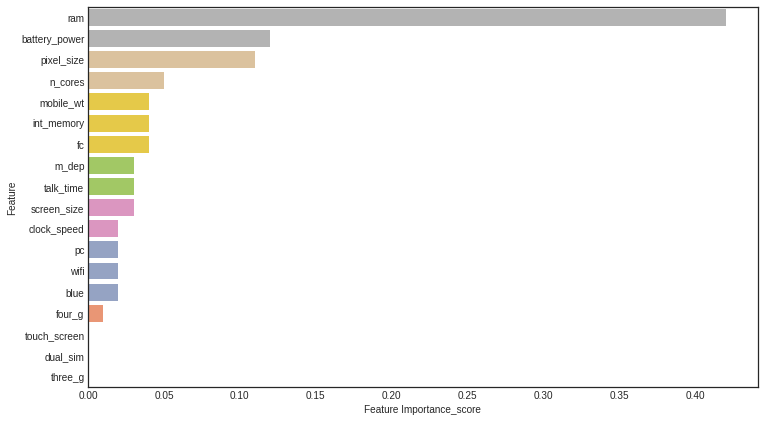

In [ ]:
fig, ax = plt.subplots(figsize=(12,7))
ax = sns.barplot(x=feature_imp_df['Feature Importance_score'], 
                 y=feature_imp_df['Feature'],
                 palette = "Set2_r")
plt.show()

#### 2. Cross- Validation & Hyperparameter Tuning

In [ ]:
# ML Model - 3 Implementation with hyperparameter optimization techniques (i.e., GridSearch CV, RandomSearch CV, Bayesian Optimization etc.)
'''xgb_model = XGBClassifier(random_state=0)

param_grid = {'n_estimators': [10, 100, 200], 
               'learning_rate': [0.3, 0.1, 0.01, 0.001], 
               'max_depth': [5, 10, 20],
               'gamma': [1.1, 1.3, 1.5], 
               'subsample': [0.3, 0.5, 0.8]}

grid = GridSearchCV(estimator=xgb_model, 
                    param_grid = param_grid, 
                    scoring = 'accuracy', 
                    cv = 5, verbose = 10)
# Fit the Algorithm
grid_result=grid.fit(X_train, y_train)'''

"xgb_model = XGBClassifier(random_state=0)\n\nparam_grid = {'n_estimators': [10, 100, 200], \n               'learning_rate': [0.3, 0.1, 0.01, 0.001], \n               'max_depth': [5, 10, 20],\n               'gamma': [1.1, 1.3, 1.5], \n               'subsample': [0.3, 0.5, 0.8]}\n\ngrid = GridSearchCV(estimator=xgb_model, \n                    param_grid = param_grid, \n                    scoring = 'accuracy', \n                    cv = 5, verbose = 10)\n# Fit the Algorithm\ngrid_result=grid.fit(X_train, y_train)"

In [ ]:
# print("Best: %f using %s" % (grid_result.best_score_, grid_result.best_params_))

In [ ]:
xgb_model = XGBClassifier(random_state=0)

best_param_grid = {'gamma': [1.1], 'learning_rate': [0.1], 'max_depth': [20], 
              'n_estimators': [200], 'subsample': [0.5]}

grid = GridSearchCV(estimator = xgb_model, 
                    param_grid = best_param_grid, 
                    scoring = 'accuracy', 
                    cv = 5, verbose = 10)
# Fit the Algorithm
grid_result=grid.fit(X_train, y_train)


Fitting 5 folds for each of 1 candidates, totalling 5 fits
[CV 1/5; 1/1] START gamma=1.1, learning_rate=0.1, max_depth=20, n_estimators=200, subsample=0.5
[CV 1/5; 1/1] END gamma=1.1, learning_rate=0.1, max_depth=20, n_estimators=200, subsample=0.5;, score=0.900 total time=   1.9s
[CV 2/5; 1/1] START gamma=1.1, learning_rate=0.1, max_depth=20, n_estimators=200, subsample=0.5
[CV 2/5; 1/1] END gamma=1.1, learning_rate=0.1, max_depth=20, n_estimators=200, subsample=0.5;, score=0.900 total time=   1.9s
[CV 3/5; 1/1] START gamma=1.1, learning_rate=0.1, max_depth=20, n_estimators=200, subsample=0.5
[CV 3/5; 1/1] END gamma=1.1, learning_rate=0.1, max_depth=20, n_estimators=200, subsample=0.5;, score=0.900 total time=   1.9s
[CV 4/5; 1/1] START gamma=1.1, learning_rate=0.1, max_depth=20, n_estimators=200, subsample=0.5
[CV 4/5; 1/1] END gamma=1.1, learning_rate=0.1, max_depth=20, n_estimators=200, subsample=0.5;, score=0.907 total time=   1.9s
[CV 5/5; 1/1] START gamma=1.1, learning_rate=0.1,

In [ ]:
# Predict on the model
# Get the predicted classes
train_class_preds = grid_result.predict(X_train)
test_class_preds = grid_result.predict(X_test)

In [ ]:
# Calculating accuracy on train and test
train_accuracy = accuracy_score(y_train, train_class_preds)
test_accuracy = accuracy_score(y_test,test_class_preds)

print("The accuracy on train dataset is", train_accuracy)
print("The accuracy on test dataset is", test_accuracy)

The accuracy on train dataset is 0.996
The accuracy on test dataset is 0.916


[[374   2   0   0]
 [  0 388   2   0]
 [  0   0 375   0]
 [  0   0   2 357]]


Text(0.5, 1.0, 'Confusion Matrix')

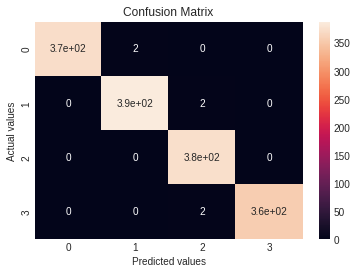

In [ ]:
# Get the confusion matrix for both train and test
cm = confusion_matrix(y_train, train_class_preds)
print(cm)

ax= plt.subplot()
sns.heatmap(cm, annot=True, ax = ax) #annot=True to annotate cells

# labels, title and ticks
ax.set_xlabel('Predicted values')
ax.set_ylabel('Actual values')
ax.set_title('Confusion Matrix')

[[121   3   0   0]
 [  8  93   9   0]
 [  0   6 111   8]
 [  0   0   8 133]]


Text(0.5, 1.0, 'Confusion Matrix')

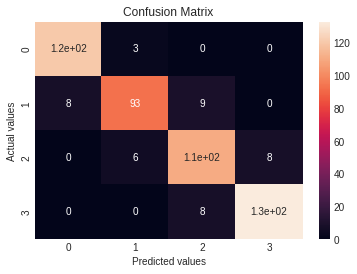

In [ ]:
# Get the confusion matrix for both train and test
cm = confusion_matrix(y_test, test_class_preds)
print(cm)

ax= plt.subplot()
sns.heatmap(cm, annot=True, ax = ax) #annot=True to annotate cells

# labels, title and ticks
ax.set_xlabel('Predicted values')
ax.set_ylabel('Actual values')
ax.set_title('Confusion Matrix')

In [ ]:
print(classification_report(train_class_preds, y_train))

              precision    recall  f1-score   support

           0       0.99      1.00      1.00       374
           1       0.99      0.99      0.99       390
           2       1.00      0.99      0.99       379
           3       0.99      1.00      1.00       357

    accuracy                           1.00      1500
   macro avg       1.00      1.00      1.00      1500
weighted avg       1.00      1.00      1.00      1500



In [ ]:
print(classification_report(test_class_preds, y_test))

              precision    recall  f1-score   support

           0       0.98      0.94      0.96       129
           1       0.85      0.91      0.88       102
           2       0.89      0.87      0.88       128
           3       0.94      0.94      0.94       141

    accuracy                           0.92       500
   macro avg       0.91      0.92      0.91       500
weighted avg       0.92      0.92      0.92       500



##### Which hyperparameter optimization technique have you used and why?

GridSearchCV which uses the Grid Search technique for finding the optimal hyperparameters to increase the model performance.

our goal should be to find the best hyperparameters values to get the perfect prediction results from our model. But the question arises, how to find these best sets of hyperparameters? One can try the Manual Search method, by using the hit and trial process and can find the best hyperparameters which would take huge time to build a single model.

For this reason, methods like Random Search, GridSearch were introduced. Grid Search uses a different combination of all the specified hyperparameters and their values and calculates the performance for each combination and selects the best value for the hyperparameters. This makes the processing time-consuming and expensive based on the number of hyperparameters involved.

In GridSearchCV, along with Grid Search, cross-validation is also performed. Cross-Validation is used while training the model.

That's why I have used GridsearCV method for hyperparameter optimization.

##### Have you seen any improvement? Note down the improvement with updates Evaluation metric Score Chart.

For training dataset, 
*   precision of 99% and recall of 100% and f1-score of 100% for Low price range mobile data.
*   precision of 99% and recall of 99% and f1-score of 99% for Medium price range mobile data.
*   precision of 100% and recall of 99% and f1-score of 99% for High price range mobile data.
*   precision of 99% and recall of 99% and f1-score of 99% for Very high price range mobile data.
*   Accuracy is 100% and average percision, recall & f1_score are 100%, 100% and 100% respectively.

Quite improvemnt in recall, f1 score as well as average recall & f1 score by some percentages.

For testing dataset, 
*   precision of 98% and recall of 94% and f1-score of 96% for Low price range mobile data.
*   precision of 85% and recall of 91% and f1-score of 88% for Medium price range mobile data.
*   precision of 89% and recall of 87% and f1-score of 88% for High price range mobile data.
*   precision of 94% and recall of 94% and f1-score of 94% for Very high price range mobile data.
*   Accuracy is 92% and average percision, recall & f1_score are 91%, 92% and 91% respectively.

Quite improvemnt in recall, f1 score as well as average recall & f1 score by 1%.


### ML Model - 4 - **Implementing Support Vector Classifier**



In [ ]:
# ML Model - 4 Implementation
svc = SVC(kernel='linear', random_state=0)
# Fit the Algorithm
svc.fit(X_train, y_train)

SVC(kernel='linear', random_state=0)

In [ ]:
# Predict on the model
# Making predictions on train and test data
train_class_preds = svc.predict(X_train)
test_class_preds = svc.predict(X_test)

In [ ]:
accuracy_score(y_test, test_class_preds)

0.92

In [ ]:
# Calculating accuracy on train and test
train_accuracy = accuracy_score(y_train, train_class_preds)
test_accuracy = accuracy_score(y_test,test_class_preds)

print("The accuracy on train dataset is", train_accuracy)
print("The accuracy on test dataset is", test_accuracy)

The accuracy on train dataset is 0.9473333333333334
The accuracy on test dataset is 0.92


#### 1. Explain the ML Model used and it's performance using Evaluation metric Score Chart.

[[365  11   0   0]
 [ 14 367   9   0]
 [  0  19 344  12]
 [  0   0  14 345]]


Text(0.5, 1.0, 'Confusion Matrix')

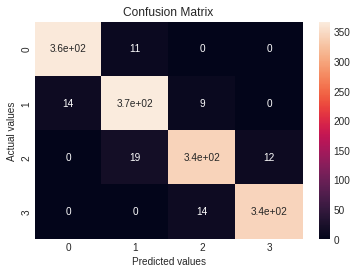

In [ ]:
# Get the confusion matrix for both train and test
cm = confusion_matrix(y_train, train_class_preds)
print(cm)

ax= plt.subplot()
sns.heatmap(cm, annot=True, ax = ax) #annot=True to annotate cells

# labels, title and ticks
ax.set_xlabel('Predicted values')
ax.set_ylabel('Actual values')
ax.set_title('Confusion Matrix')

[[122   2   0   0]
 [  5  96   9   0]
 [  0   8 110   7]
 [  0   0   9 132]]


Text(0.5, 1.0, 'Confusion Matrix')

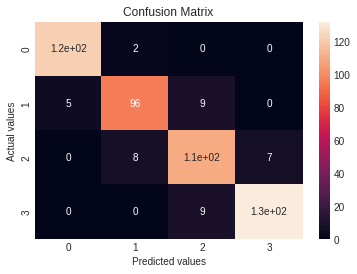

In [ ]:
# Get the confusion matrix for both train and test
cm = confusion_matrix(y_test, test_class_preds)
print(cm)

ax= plt.subplot()
sns.heatmap(cm, annot=True, ax = ax) #annot=True to annotate cells

# labels, title and ticks
ax.set_xlabel('Predicted values')
ax.set_ylabel('Actual values')
ax.set_title('Confusion Matrix')

In [ ]:
print(classification_report(train_class_preds, y_train))

              precision    recall  f1-score   support

           0       0.97      0.96      0.97       379
           1       0.94      0.92      0.93       397
           2       0.92      0.94      0.93       367
           3       0.96      0.97      0.96       357

    accuracy                           0.95      1500
   macro avg       0.95      0.95      0.95      1500
weighted avg       0.95      0.95      0.95      1500



In [ ]:
print(classification_report(test_class_preds, y_test))

              precision    recall  f1-score   support

           0       0.98      0.96      0.97       127
           1       0.87      0.91      0.89       106
           2       0.88      0.86      0.87       128
           3       0.94      0.95      0.94       139

    accuracy                           0.92       500
   macro avg       0.92      0.92      0.92       500
weighted avg       0.92      0.92      0.92       500



I used Support Vector algorithm to create the model.As I got good result.

For training dataset, 
*   precision of 97% and recall of 96% and f1-score of 97% for Low price range mobile data.
*   precision of 94% and recall of 92% and f1-score of 93% for Medium price range mobile data.
*   precision of 92% and recall of 94% and f1-score of 93% for High price range mobile data.
*   precision of 96% and recall of 97% and f1-score of 96% for Very high price range mobile data.
*   Accuracy is 95% and average percision, recall & f1_score are 95%, 95% and 95% respectively.

For testing dataset,
*  precision of 98% and recall of 96% and f1-score of 97% for Low price range mobile data. 
*   precision of 87% and recall of 91% and f1-score of 89% for Medium price range mobile data. 
*   precision of 88% and recall of 86% and f1-score of 87% for High price range mobile data.
*   precision of 94% and recall of 95% and f1-score of 94% for Very high price range mobile data. 
*   Accuracy is 92% and average percision, recall & f1_score are 92%, 92% and 92% respectively.

Next tryting to improving the score by using hyperparameter tuning technique.


#### 2. Cross- Validation & Hyperparameter Tuning

In [ ]:
# ML Model - 4 Implementation with hyperparameter optimization techniques (i.e., GridSearch CV, RandomSearch CV, Bayesian Optimization etc.)
svc_model = SVC( kernel='linear', random_state=0)

param_grid = { 'kernel': ['linear'], 'C': [1, 5, 10, 15, 10] }

grid = GridSearchCV(estimator=svc_model, 
                    param_grid = param_grid, 
                    scoring = 'accuracy', 
                    cv = 10, verbose = 10)
# Fit the Algorithm
grid_result=grid.fit(X_train, y_train)

Fitting 10 folds for each of 5 candidates, totalling 50 fits
[CV 1/10; 1/5] START C=1, kernel=linear.........................................
[CV 1/10; 1/5] END ..........C=1, kernel=linear;, score=0.953 total time=   0.0s
[CV 2/10; 1/5] START C=1, kernel=linear.........................................
[CV 2/10; 1/5] END ..........C=1, kernel=linear;, score=0.947 total time=   0.0s
[CV 3/10; 1/5] START C=1, kernel=linear.........................................
[CV 3/10; 1/5] END ..........C=1, kernel=linear;, score=0.933 total time=   0.0s
[CV 4/10; 1/5] START C=1, kernel=linear.........................................
[CV 4/10; 1/5] END ..........C=1, kernel=linear;, score=0.907 total time=   0.0s
[CV 5/10; 1/5] START C=1, kernel=linear.........................................
[CV 5/10; 1/5] END ..........C=1, kernel=linear;, score=0.933 total time=   0.1s
[CV 6/10; 1/5] START C=1, kernel=linear.........................................
[CV 6/10; 1/5] END ..........C=1, kernel=linear;

In [ ]:
print("Best: %f using %s" % (grid_result.best_score_, grid_result.best_params_))

Best: 0.933333 using {'C': 10, 'kernel': 'linear'}


In [ ]:
# Predict on the model
# Get the predicted classes
train_class_preds = grid_result.predict(X_train)
test_class_preds = grid_result.predict(X_test)

[[369   7   0   0]
 [ 14 362  14   0]
 [  0  16 347  12]
 [  0   0  11 348]]


Text(0.5, 1.0, 'Confusion Matrix')

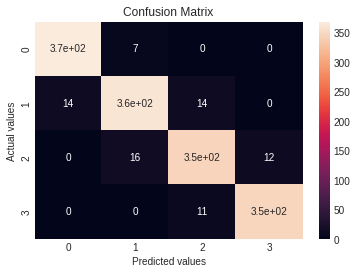

In [ ]:
# Get the confusion matrix for both train and test
cm = confusion_matrix(y_train, train_class_preds)
print(cm)

ax= plt.subplot()
sns.heatmap(cm, annot=True, ax = ax) #annot=True to annotate cells

# labels, title and ticks
ax.set_xlabel('Predicted values')
ax.set_ylabel('Actual values')
ax.set_title('Confusion Matrix')

[[123   1   0   0]
 [  3 100   7   0]
 [  0   8 108   9]
 [  0   0  10 131]]


Text(0.5, 1.0, 'Confusion Matrix')

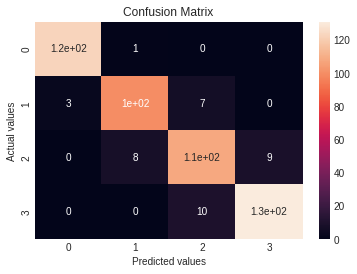

In [ ]:
# Get the confusion matrix for both train and test
cm = confusion_matrix(y_test, test_class_preds)
print(cm)

ax= plt.subplot()
sns.heatmap(cm, annot=True, ax = ax) #annot=True to annotate cells

# labels, title and ticks
ax.set_xlabel('Predicted values')
ax.set_ylabel('Actual values')
ax.set_title('Confusion Matrix')

In [ ]:
print(classification_report(train_class_preds, y_train))

              precision    recall  f1-score   support

           0       0.98      0.96      0.97       383
           1       0.93      0.94      0.93       385
           2       0.93      0.93      0.93       372
           3       0.97      0.97      0.97       360

    accuracy                           0.95      1500
   macro avg       0.95      0.95      0.95      1500
weighted avg       0.95      0.95      0.95      1500



In [ ]:
print(classification_report(test_class_preds, y_test))

              precision    recall  f1-score   support

           0       0.99      0.98      0.98       126
           1       0.91      0.92      0.91       109
           2       0.86      0.86      0.86       125
           3       0.93      0.94      0.93       140

    accuracy                           0.92       500
   macro avg       0.92      0.92      0.92       500
weighted avg       0.92      0.92      0.92       500



##### Which hyperparameter optimization technique have you used and why?

GridSearchCV which uses the Grid Search technique for finding the optimal hyperparameters to increase the model performance.

our goal should be to find the best hyperparameters values to get the perfect prediction results from our model. But the question arises, how to find these best sets of hyperparameters? One can try the Manual Search method, by using the hit and trial process and can find the best hyperparameters which would take huge time to build a single model.

For this reason, methods like Random Search, GridSearch were introduced. Grid Search uses a different combination of all the specified hyperparameters and their values and calculates the performance for each combination and selects the best value for the hyperparameters. This makes the processing time-consuming and expensive based on the number of hyperparameters involved.

In GridSearchCV, along with Grid Search, cross-validation is also performed. Cross-Validation is used while training the model.

That's why I have used GridsearCV method for hyperparameter optimization.

##### Have you seen any improvement? Note down the improvement with updates Evaluation metric Score Chart.

For training dataset, 
*   precision of 99% and recall of 96% and f1-score of 97% for Low price range mobile data.
*   precision of 93% and recall of 94% and f1-score of 93% for Medium price range mobile data.
*   precision of 93% and recall of 93% and f1-score of 93% for High price range mobile data.
*   precision of 97% and recall of 97% and f1-score of 97% for Very high price range mobile data.
*   Accuracy is 95% and average percision, recall & f1_score are 95%, 95% and 95% respectively.

No improvement or decreament every score is constant as earlier.

For testing dataset, 
*   precision of 99% and recall of 98% and f1-score of 98% for Low price range mobile data.
*   precision of 91% and recall of 92% and f1-score of 91% for Medium price range mobile data.
*   precision of 86% and recall of 86% and f1-score of 86% for High price range mobile data.
*   precision of 93% and recall of 94% and f1-score of 93% for Very high price range mobile data.
*   Accuracy is 92% and average percision, recall & f1_score are 92%, 92% and 92% respectively.

No improvement or decreament every score is constant as earlier.


### 1. Which Evaluation metrics did you consider for a positive business impact and why?

I would like to go with both Recall and Precision and which describes both is F1 Score.

To reduce false negative recall is important and to reduce false positives precision is important. Where both are important to be minimized, f1_score is being considered. False Positive is defined as the model predicted that the mobile price range will low price range but the mobile price range didn't low price range, the mobile price range will medium price range but the mobile price range didn't medium price range, the mobile price range will high price range but the mobile price range didn't high price range, the mobile price range will very high price range but the mobile price range didn't very high price range.

But according to our model it will low price range so, there would be quite chance of his medium price range, high price range, very high price range not for immediate but after some times.

according to our model it will medium price range so, there would be quite chance of his low price range, high price range, very high price range not for immediate but after some times.

according to our model it will high price range so, there would be quite chance of his low price range, medium price range, very high price range not for immediate but after some times.

according to our model it will very high price range so, there would be quite chance of his low price range, medium price range, high price range, not for immediate but after some times.

So, for those type of customers we can send them some beneficial modified offers to retain them. Again false negative defines as model will predict that the customer won't churn but the customer really churned. 

  That will be an issue for us. So, for that case we have to minimize the false negative. and false positive we must improve the score of both precision as well as recall which should direclt affect the f1_score positively. So, in our case recall will stand the higher but precision can't be neglected. so, recall should be higher and f1_score should be moderate.

### 2. Which ML model did you choose from the above created models as your final prediction model and why?

I chose the logistic regression model which is hyperparameter optimized because that model gave me the best accuracy score compared to the other model.

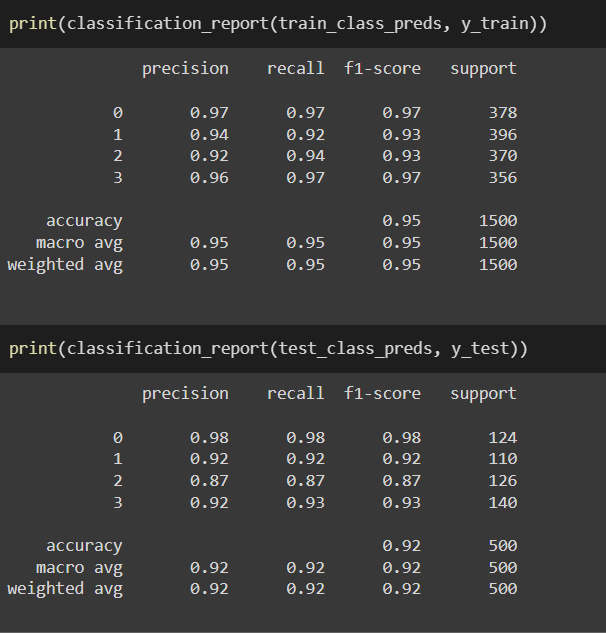

### 3. Explain the model which you have used and the feature importance using any model explainability tool?

In [ ]:
!pip install shap==0.41.0
import shap
sns.set(style="darkgrid")
pd.set_option("display.max_columns",None)
import warnings
warnings.filterwarnings('ignore')

Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/


In [ ]:
#Get shap values
explainer = shap.LinearExplainer(log_r, X_train, feature_perturbation="interventional")
shap_values = explainer.shap_values(X_test)

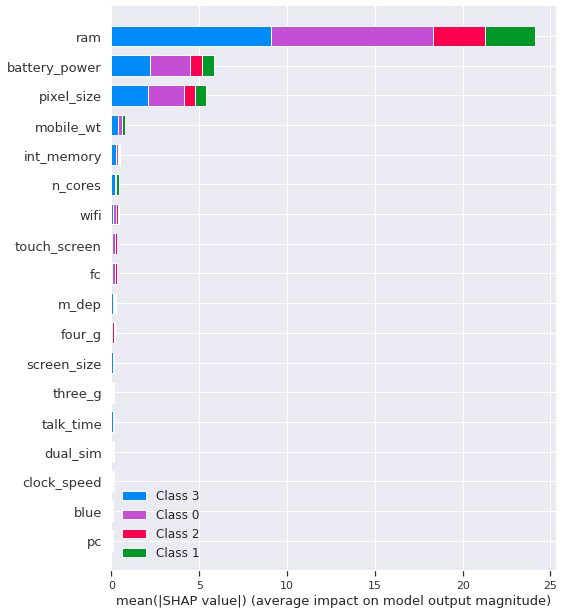

In [ ]:
# summary plot for first observation
shap.summary_plot(shap_values, X_test, feature_names=list(X.columns))

I can clearly see that only Three variables are very important and influencing the class prediction, while rest of the variables have no importance.
*  ram
* battery power
* pixel_size

In [ ]:
# Initialize JavaScript visualizations in notebook environment
shap.initjs()

# prediction class 2, shap values for class 2 observation
shap.force_plot(explainer.expected_value[2], shap_values[2][2], X_test[2], feature_names=list(X.columns))

In [ ]:
# Initialize JavaScript visualizations in notebook environment
shap.initjs()

# prediction class 2, shap values for class 3 observation
shap.force_plot(explainer.expected_value[2], shap_values[3][2], X_test[2], feature_names=list(X.columns))

In [ ]:
# Initialize JavaScript visualizations in notebook environment
shap.initjs()

# prediction class 0, shap values for class 0 observation
shap.force_plot(explainer.expected_value[0], shap_values[0][300], X_test[300], feature_names=list(X.columns))

In [ ]:
# Initialize JavaScript visualizations in notebook environment
shap.initjs()

# prediction class 0, shap values for class 3 observation
shap.force_plot(explainer.expected_value[3], shap_values[3][300], X_test[300], feature_names=list(X.columns))

I can straight away see that shap value model interpretability is very effective. It explains the variable contribution in additive sense which is easier to grasp and also shows which variables are influencing the decision.

# **Conclusion**

1.  From EDA we can see that here are mobile phones in 4 price ranges and number of elements is almost similar.
2.  Ram has continuous increase with price range while moving from Low cost to Very high cost.
3.  Half the devices have Bluetooth, wifi, dual sim and half don’t have.
4.  The mobile price range has almost constant battery, internal memory, and primary camera.
5.  costly phones are lighter.
6.  The feature RAM, battery power, pixel size played more important role in deciding the price range of mobile phone.

7. From all the above experiments we can conclude that logistic regression with hyperparameter, support vector classifier and XGBoost classifier gave us the best results.

8.  No overfitting is seen.

9.  The accuracy and performance of the model is evaluated by using confusion matrix.

### ***Hurrah! You have successfully completed your Machine Learning Capstone Project !!!***